# single-cell-analysis-Scanpy-COVID 19 PMBC 

In [195]:
## scRNA-seq anlysis using Scanpy for six PBMC samples 

In [196]:
# pip install scanpy 

In [197]:
## Load Libraries 
import numpy as np 
import pandas as pd 
import scanpy as sc 
import matplotlib as plt
import seaborn as sns



In [198]:

# setting verbosity 
sc.settings.verbosity = 3


### Loading data 

In [199]:
# read data files 
## Also making var names unique 
data_cov1 = sc.read_10x_h5('./data/raw/nCoV_PBMC_1.h5')
data_cov1.var_names_make_unique()
data_cov15 = sc.read_10x_h5('./data/raw/nCoV_PBMC_15.h5')
data_cov15.var_names_make_unique()
data_cov17 = sc.read_10x_h5('./data/raw/nCoV_PBMC_17.h5')
data_cov17.var_names_make_unique()
data_ctrl5 = sc.read_10x_h5('./data/raw/Normal_PBMC_5.h5')
data_ctrl5.var_names_make_unique()
data_ctrl13 = sc.read_10x_h5('./data/raw/Normal_PBMC_13.h5')
data_ctrl13.var_names_make_unique()
data_ctrl14 = sc.read_10x_h5('./data/raw/Normal_PBMC_14.h5')
data_ctrl14.var_names_make_unique()

reading ./data/raw/nCoV_PBMC_1.h5


/Users/zeus_10/Desktop/Projects/Single cell_scanpy/single_cell_covid/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1756: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


 (0:00:00)
reading ./data/raw/nCoV_PBMC_15.h5


/Users/zeus_10/Desktop/Projects/Single cell_scanpy/single_cell_covid/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1756: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


 (0:00:00)


/Users/zeus_10/Desktop/Projects/Single cell_scanpy/single_cell_covid/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1756: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/Users/zeus_10/Desktop/Projects/Single cell_scanpy/single_cell_covid/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1756: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


reading ./data/raw/nCoV_PBMC_17.h5
 (0:00:00)
reading ./data/raw/Normal_PBMC_5.h5
 (0:00:00)


/Users/zeus_10/Desktop/Projects/Single cell_scanpy/single_cell_covid/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1756: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/Users/zeus_10/Desktop/Projects/Single cell_scanpy/single_cell_covid/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1756: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/Users/zeus_10/Desktop/Projects/Single cell_scanpy/single_cell_covid/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1756: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/Users/zeus_10/Desktop/Projects/Single cell_scanpy/single_cell_covid/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1756: UserWarning: Variable names are not unique. To make them uniq

reading ./data/raw/Normal_PBMC_13.h5
 (0:00:00)
reading ./data/raw/Normal_PBMC_14.h5
 (0:00:00)


/Users/zeus_10/Desktop/Projects/Single cell_scanpy/single_cell_covid/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1756: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/Users/zeus_10/Desktop/Projects/Single cell_scanpy/single_cell_covid/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1756: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/Users/zeus_10/Desktop/Projects/Single cell_scanpy/single_cell_covid/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1756: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/Users/zeus_10/Desktop/Projects/Single cell_scanpy/single_cell_covid/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1756: UserWarning: Variable names are not unique. To make them uniq

In [200]:
# Creating merged object from samples 
data_cov1.obs['type']="Covid"
data_cov1.obs['sample']="covid_1"
data_cov15.obs['type']="Covid"
data_cov15.obs['sample']="covid_15"
data_cov17.obs['type']="Covid"
data_cov17.obs['sample']="covid_17"
data_ctrl5.obs['type']="Ctrl"
data_ctrl5.obs['sample']="ctrl_5"
data_ctrl13.obs['type']="Ctrl"
data_ctrl13.obs['sample']="ctrl_13"
data_ctrl14.obs['type']="Ctrl"
data_ctrl14.obs['sample']="ctrl_14"

In [201]:
# Creating Ann data object for further Analysis

adata = data_cov1.concatenate( data_cov15, data_cov17, data_ctrl5, data_ctrl14, data_ctrl13 )

/var/folders/mn/jc4_tkl910gcsv_h9ddxdzqr0000gn/T/ipykernel_82400/2714589487.py:3: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  adata = data_cov1.concatenate( data_cov15, data_cov17, data_ctrl5, data_ctrl14, data_ctrl13 )


In [202]:
# delete individual datasets to save space
del(data_cov1, data_cov15, data_cov17)
del(data_ctrl5, data_ctrl13, data_ctrl14)


In [203]:
## data 
adata

AnnData object with n_obs × n_vars = 9000 × 33538
    obs: 'type', 'sample', 'batch'
    var: 'gene_ids', 'feature_types', 'genome'

In [204]:
# values 

adata.obs['sample'].value_counts()

sample
covid_1     1500
covid_15    1500
covid_17    1500
ctrl_5      1500
ctrl_14     1500
ctrl_13     1500
Name: count, dtype: int64

In [205]:
## Quality Control 

# Mitochondrial Genes
adata.var['mt'] = adata.var_names.str.startswith('MT-')

# Ribosomal Genes 
adata.var['ribo'] = adata.var_names.str.startswith(("RPS","RBL"))

# Hemoglobin genes
adata.var['hb'] = adata.var_names.str.contains(("^HB[^(P)]"))

adata.var



,gene_ids,feature_types,genome,mt,ribo,hb
MIR1302-2HG,ENSG00000243485,Gene Expression,GRCh38,False,False,False
FAM138A,ENSG00000237613,Gene Expression,GRCh38,False,False,False
OR4F5,ENSG00000186092,Gene Expression,GRCh38,False,False,False
AL627309.1,ENSG00000238009,Gene Expression,GRCh38,False,False,False
AL627309.3,ENSG00000239945,Gene Expression,GRCh38,False,False,False
...,...,...,...,...,...,...
AC233755.2,ENSG00000277856,Gene Expression,GRCh38,False,False,False
AC233755.1,ENSG00000275063,Gene Expression,GRCh38,False,False,False
AC240274.1,ENSG00000271254,Gene Expression,GRCh38,False,False,False
AC213203.1,ENSG00000277475,Gene Expression,GRCh38,False,False,False


In [206]:
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt', 'ribo', 'hb'], percent_top=None, log1p=False, inplace=True)


In [207]:

mito_genes = adata.var_names.str.startswith('Mt-')


In [208]:

adata.obs['percent_mt2'] = np.sum(
    adata[:, mito_genes].X, axis=1).A1 / np.sum(adata.X, axis=1).A1


In [209]:


adata.obs['n_counts'] = adata.X.sum(axis=1).A1
adata

AnnData object with n_obs × n_vars = 9000 × 33538
    obs: 'type', 'sample', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'percent_mt2', 'n_counts'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

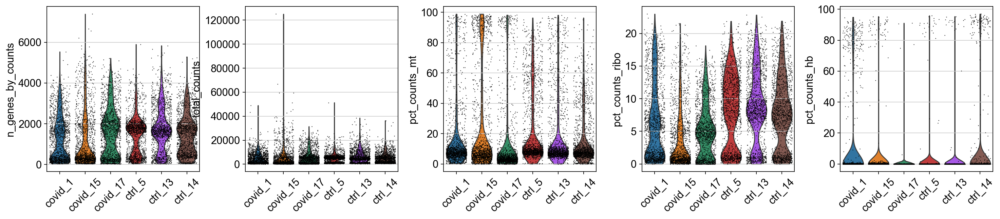

In [210]:
# Plotting Qc Metrics 

# Violin Plot 
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt', 'pct_counts_ribo', 'pct_counts_hb'], jitter = 0.4, groupby='sample', rotation = 45)

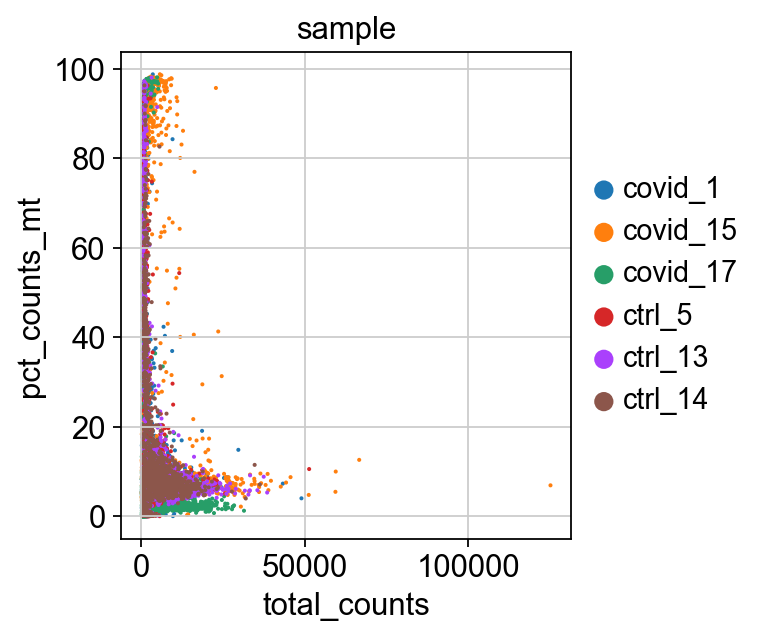

In [211]:
# Scatter Plot of the total counts 

sc.pl.scatter(adata, x = 'total_counts', y = 'pct_counts_mt', color = 'sample')

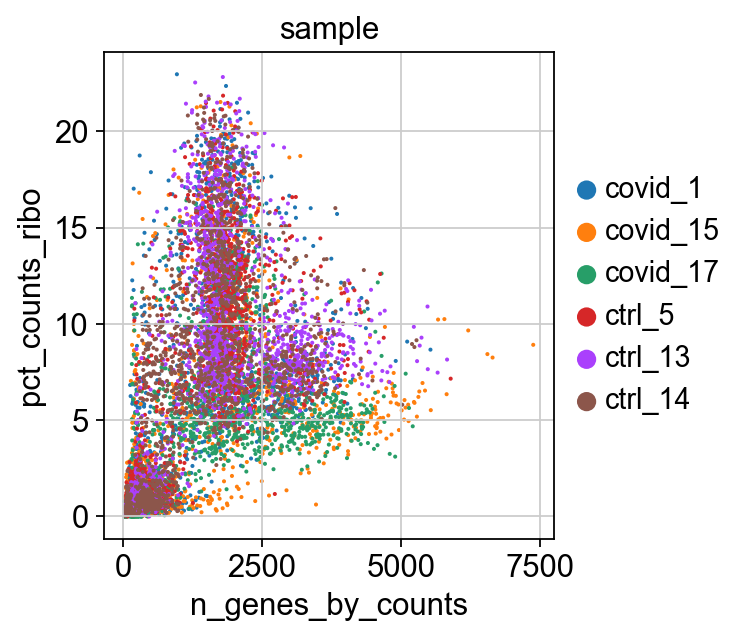

In [212]:
sc.pl.scatter(adata, x='n_genes_by_counts', y='pct_counts_ribo', color='sample')

In [213]:
# Filtering 

## filtering cells that min 200 genes 
sc.pp.filter_cells(adata, min_genes = 200)

## filtering genes that are in atleast 3 cells 
sc.pp.filter_genes(adata, min_cells = 3)

print(adata.n_obs, adata.n_vars)



filtered out 1021 cells that have less than 200 genes expressed
filtered out 14760 genes that are detected in less than 3 cells
7979 18778


normalizing counts per cell
    finished (0:00:00)


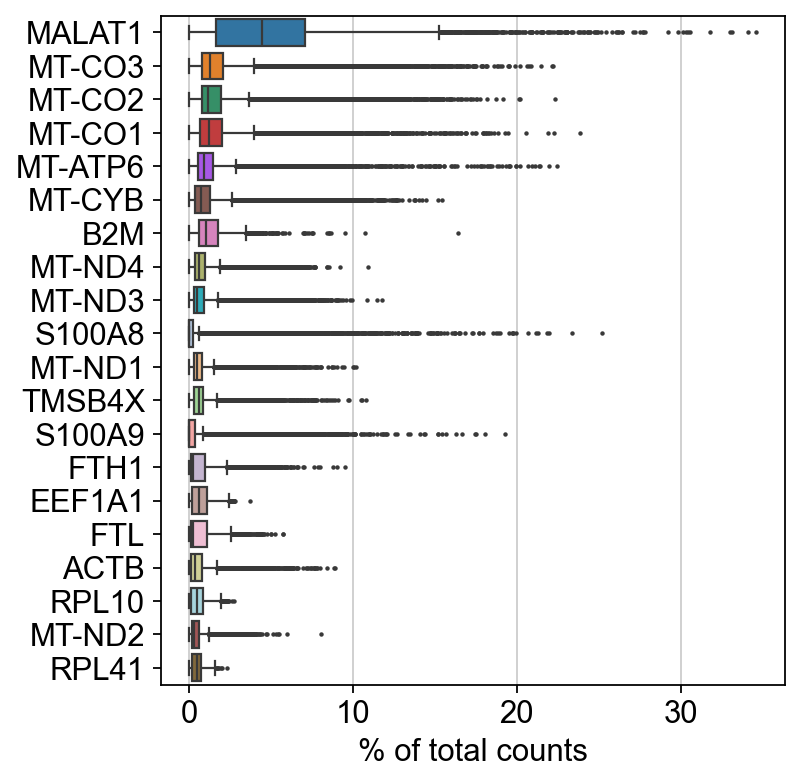

In [214]:
sc.pl.highest_expr_genes(adata, n_top=20)

In [215]:
## Mitchondrial and Ribosomal Filtering 
adata = adata[adata.obs['pct_counts_mt'] < 20, :]
adata = adata[adata.obs['pct_counts_ribo'] > 5, :] 
print("Remaining cells %d"%adata.n_obs)

Remaining cells 5048


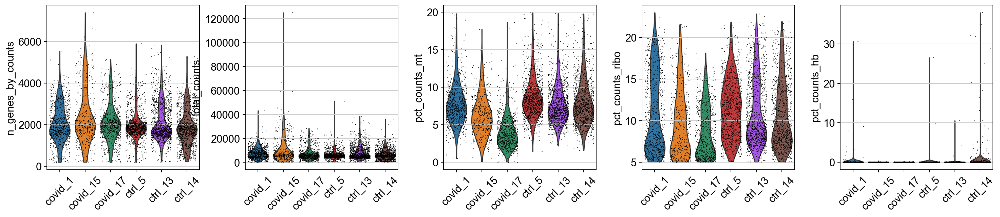

In [216]:
### Plotting Filtered QC metrics
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt', 'pct_counts_ribo', 'pct_counts_hb'],
            jitter=0.4, groupby = 'sample', rotation =45)


In [217]:
# Filter based on genes 
## MALAT1
malat1 = adata.var_names.str.startswith('MALAT1')


In [218]:

mito_genes = adata.var_names.str.startswith('MT-')


In [219]:
hb_genes = adata.var_names.str.contains('^HB[^(P)]')

In [220]:
remove = np.add(mito_genes, malat1)
remove = np.add(remove, hb_genes)
keep = np.invert(remove)

adata = adata[:,keep]

print(adata.n_obs, adata.n_vars)

5048 18752


In [221]:
## Sampling 

annot = sc.queries.biomart_annotations(
        "hsapiens",
        ["ensembl_gene_id", "external_gene_name", "start_position", "end_position", "chromosome_name"],
    ).set_index("external_gene_name")



In [222]:
chrY_genes = adata.var_names.intersection(annot.index[annot.chromosome_name == "Y"])
chrY_genes

Index(['PLCXD1', 'GTPBP6', 'LINC00685', 'PPP2R3B', 'CRLF2', 'CSF2RA', 'IL3RA',
       'SLC25A6', 'LINC00106', 'ASMTL-AS1', 'ASMTL', 'P2RY8', 'AKAP17A',
       'ASMT', 'DHRSX', 'ZBED1', 'LINC00102', 'CD99', 'VAMP7', 'IL9R',
       'RPS4Y1', 'ZFY', 'ZFY-AS1', 'LINC00278', 'PCDH11Y', 'USP9Y', 'DDX3Y',
       'UTY', 'TMSB4Y', 'NLGN4Y', 'TTTY14', 'KDM5D', 'EIF1AY', 'RPS4Y2'],
      dtype='object')

In [223]:
adata.obs['percent_chrY'] = np.sum(
    adata[:, chrY_genes].X, axis=1).A1 / np.sum(adata.X, axis=1).A1 * 100

/var/folders/mn/jc4_tkl910gcsv_h9ddxdzqr0000gn/T/ipykernel_82400/4037913768.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['percent_chrY'] = np.sum(


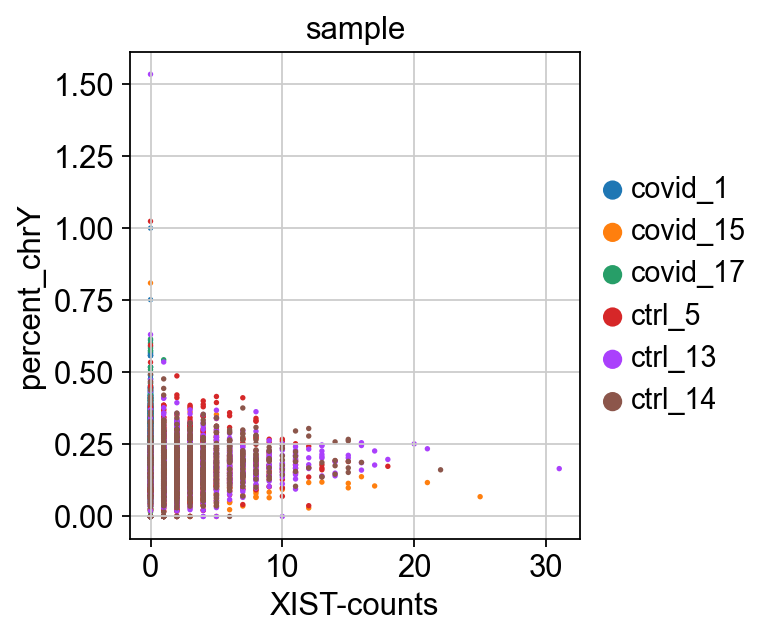

In [224]:
adata.obs["XIST-counts"] = adata.X[:,adata.var_names.str.match('XIST')].toarray()

sc.pl.scatter(adata, x='XIST-counts', y='percent_chrY', color="sample")

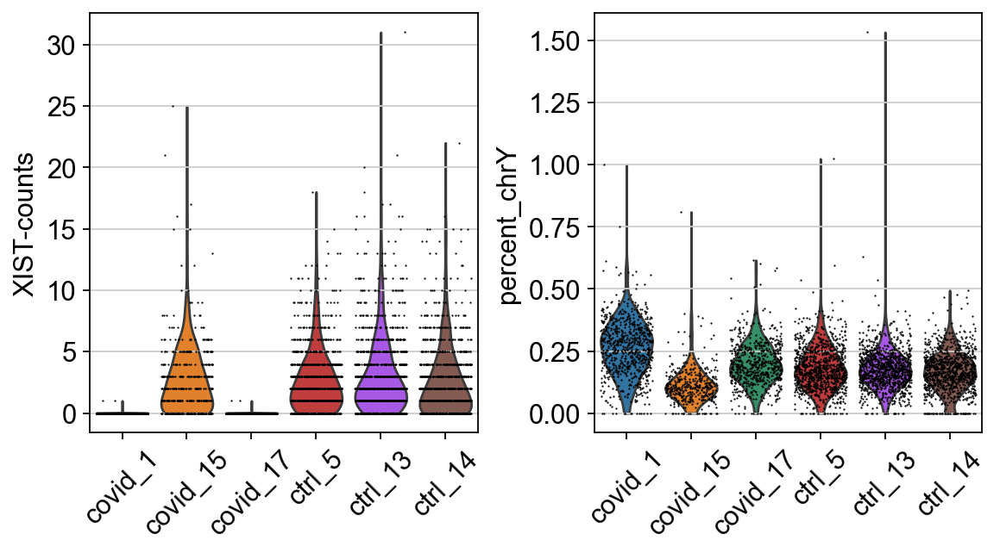

In [225]:
sc.pl.violin(adata, ["XIST-counts", "percent_chrY"], jitter=0.4, groupby = 'sample', rotation= 45)

## Normalized DATA 




In [226]:
# save normalized counts in raw slot.
adata.raw = adata

# normalize to depth 10 000
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)

# logaritmize
sc.pp.log1p(adata)

# scale
sc.pp.scale(adata)


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added
    'n_counts', counts per cell before normalization (adata.obs)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


## Predicting Doublets 


In [227]:
import scrublet as scr

Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.40
Detected doublet rate = 3.2%
Estimated detectable doublet fraction = 46.9%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 6.8%
Elapsed time: 6.3 seconds


160

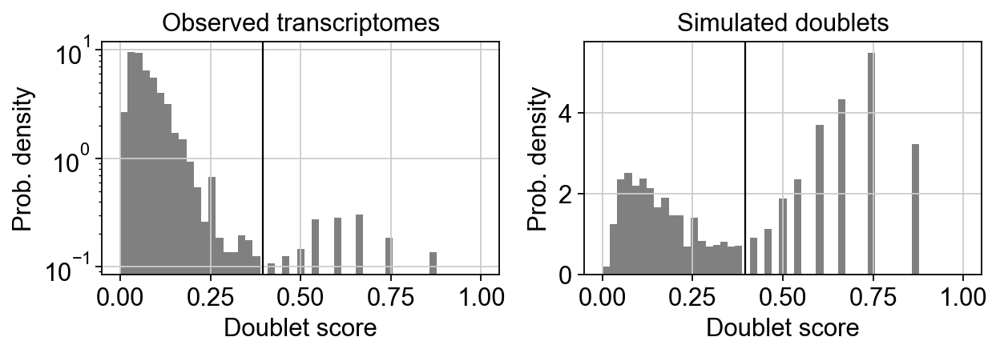

In [228]:
scrub = scr.Scrublet(adata.raw.X)
adata.obs['doublet_scores'], adata.obs['predicted_doublets'] = scrub.scrub_doublets()
scrub.plot_histogram()

sum(adata.obs['predicted_doublets'])

In [229]:
adata.obs['doublet_info'] = adata.obs["predicted_doublets"].astype(str)

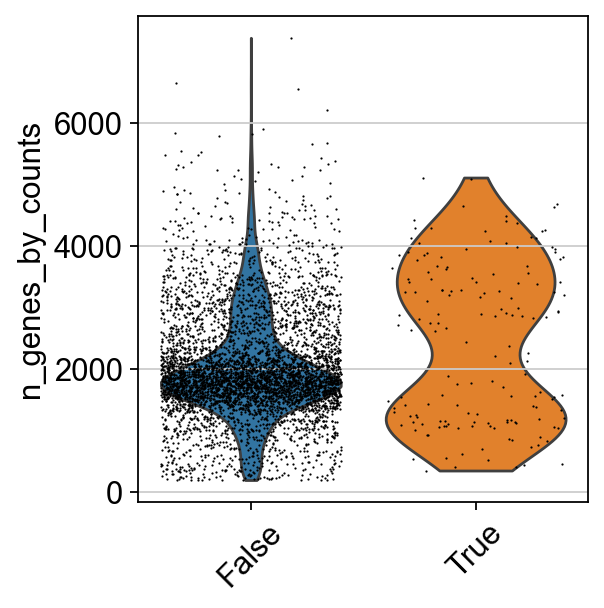

In [230]:
sc.pl.violin(adata, 'n_genes_by_counts',
             jitter=0.4, groupby = 'doublet_info', rotation=45)

In [231]:
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)
adata = adata[:, adata.var.highly_variable]
sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt'])
sc.pp.scale(adata, max_value=10)
sc.tl.pca(adata, svd_solver='arpack')
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40)
sc.tl.umap(adata)

extracting highly variable genes
    finished (0:00:03)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
regressing out ['total_counts', 'pct_counts_mt']


/Users/zeus_10/Desktop/Projects/Single cell_scanpy/single_cell_covid/.venv/lib/python3.11/site-packages/scanpy/preprocessing/_simple.py:668: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:09)
computing PCA
    with n_comps=50
    finished (0:00:02)
computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:07)


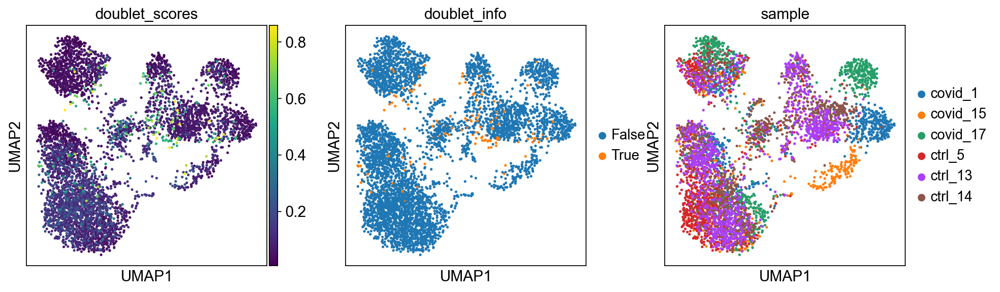

In [232]:
sc.pl.umap(adata, color=['doublet_scores','doublet_info','sample'])

In [233]:
adata = adata.raw.to_adata() 

adata = adata[adata.obs['doublet_info'] == 'False',:]
print(adata.shape)

(4888, 18752)


In [234]:
import os
os.makedirs('data/results/', exist_ok=True)

save_file = 'data/results/scanpy_qc_filtered_covid.h5ad'
adata.write_h5ad(save_file)

## DIMENSIONALITY REDUCTION 


In [235]:
sc.settings.set_figure_params(dpi=80)

In [236]:

adata = sc.read_h5ad('data/results/scanpy_qc_filtered_covid.h5ad')

In [237]:
adata

AnnData object with n_obs × n_vars = 4888 × 18752
    obs: 'type', 'sample', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'percent_mt2', 'n_counts', 'n_genes', 'percent_chrY', 'XIST-counts', 'doublet_scores', 'predicted_doublets', 'doublet_info'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells'
    uns: 'doublet_info_colors', 'hvg', 'log1p', 'neighbors', 'pca', 'sample_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    obsp: 'connectivities', 'distances'

In [238]:


# normalize to depth 10 000
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)

# logaritmize
sc.pp.log1p(adata)


# store normalized counts in the raw slot, 
# will subset adata.X for variable genes, but want to keep all genes matrix as well.
adata.raw = adata

adata

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added
    'n_counts', counts per cell before normalization (adata.obs)


AnnData object with n_obs × n_vars = 4888 × 18752
    obs: 'type', 'sample', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'percent_mt2', 'n_counts', 'n_genes', 'percent_chrY', 'XIST-counts', 'doublet_scores', 'predicted_doublets', 'doublet_info'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells'
    uns: 'doublet_info_colors', 'hvg', 'log1p', 'neighbors', 'pca', 'sample_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    obsp: 'connectivities', 'distances'

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
Highly variable genes: 3181


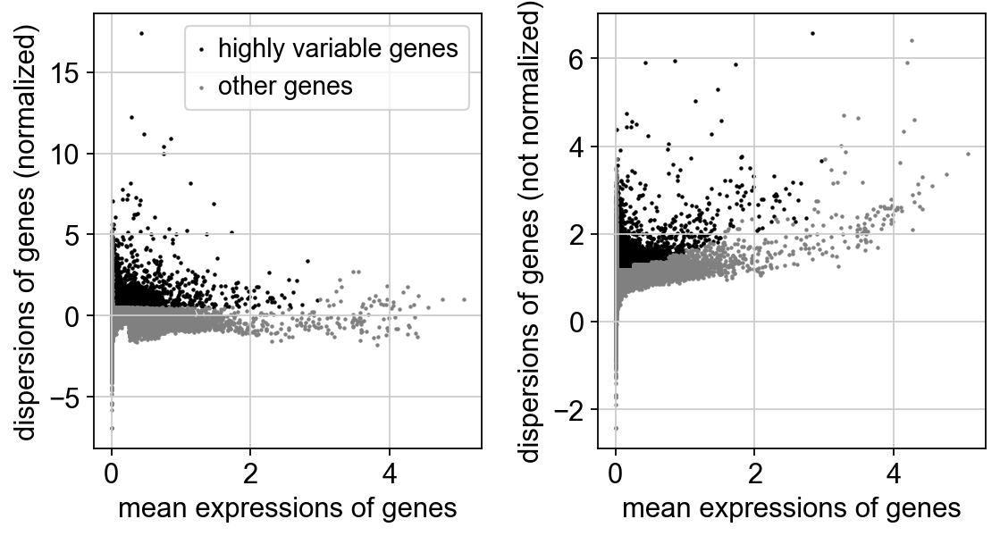

In [239]:
# compute variable genes 
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)
print("Highly variable genes: %d"%sum(adata.var.highly_variable))

# plot variable genes
sc.pl.highly_variable_genes(adata)

#subset for variable genes in dataset
adata = adata[:, adata.var['highly_variable']]

## Z-score transformation

In [240]:
# regress out 
sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt'])

# scale data
sc.pp.scale(adata, max_value=10)

regressing out ['total_counts', 'pct_counts_mt']
    sparse input is densified and may lead to high memory use


/Users/zeus_10/Desktop/Projects/Single cell_scanpy/single_cell_covid/.venv/lib/python3.11/site-packages/scanpy/preprocessing/_simple.py:668: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:10)


## PCA

In [241]:
sc.tl.pca(adata, svd_solver='arpack')

computing PCA
    with n_comps=50
    finished (0:00:01)


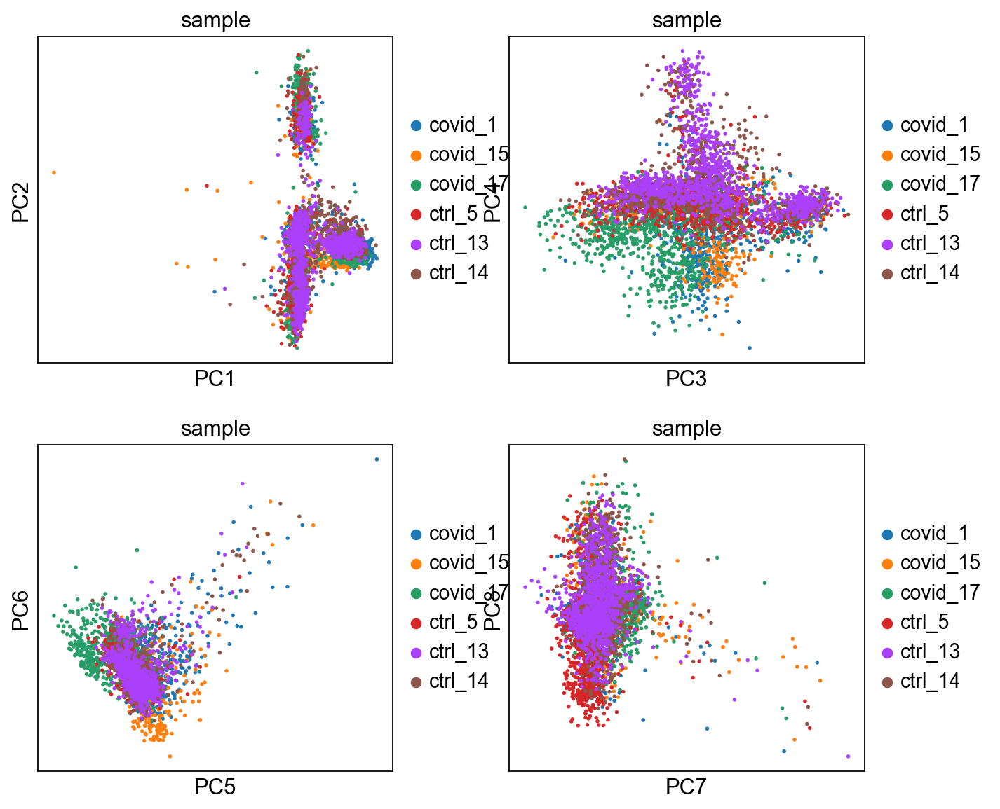

In [242]:

sc.pl.pca(adata, color='sample', components = ['1,2', '3,4', '5,6', '7,8'], ncols=2)

/Users/zeus_10/Desktop/Projects/Single cell_scanpy/single_cell_covid/.venv/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 8942 (\N{VERTICAL ELLIPSIS}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


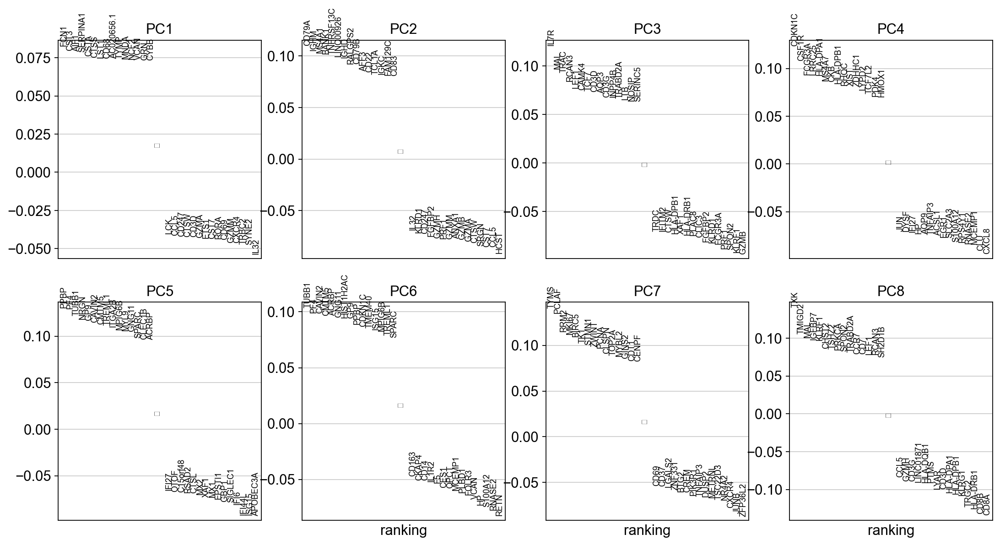

In [243]:
# plot loading
sc.pl.pca_loadings(adata, components=[1,2,3,4,5,6,7,8])

/var/folders/mn/jc4_tkl910gcsv_h9ddxdzqr0000gn/T/ipykernel_82400/3760547985.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  sc.pl.heatmap(tempdata, var_names = genes[sel].index.tolist(), groupby='predicted_doublets', swap_axes = True, use_raw=False)


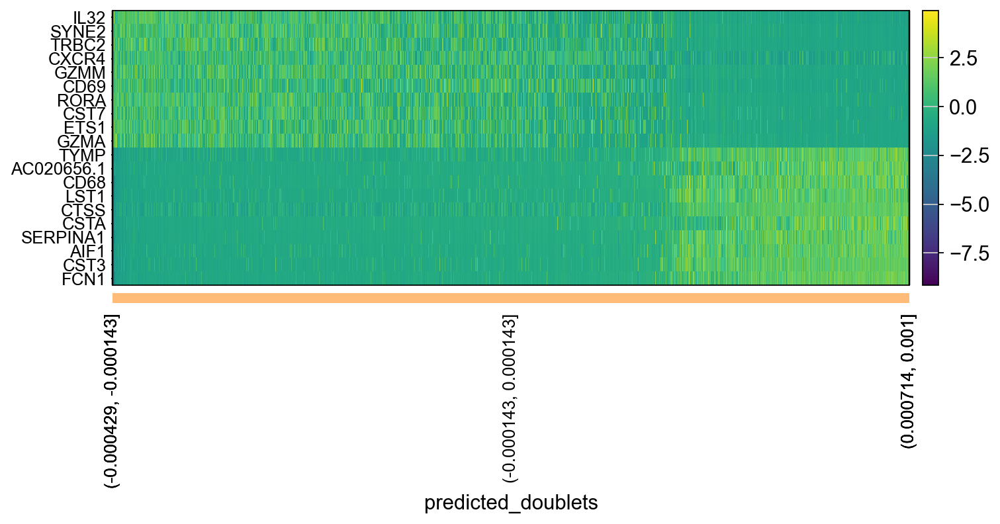

/var/folders/mn/jc4_tkl910gcsv_h9ddxdzqr0000gn/T/ipykernel_82400/3760547985.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  sc.pl.heatmap(tempdata, var_names = genes[sel].index.tolist(), groupby='predicted_doublets', swap_axes = True, use_raw=False)


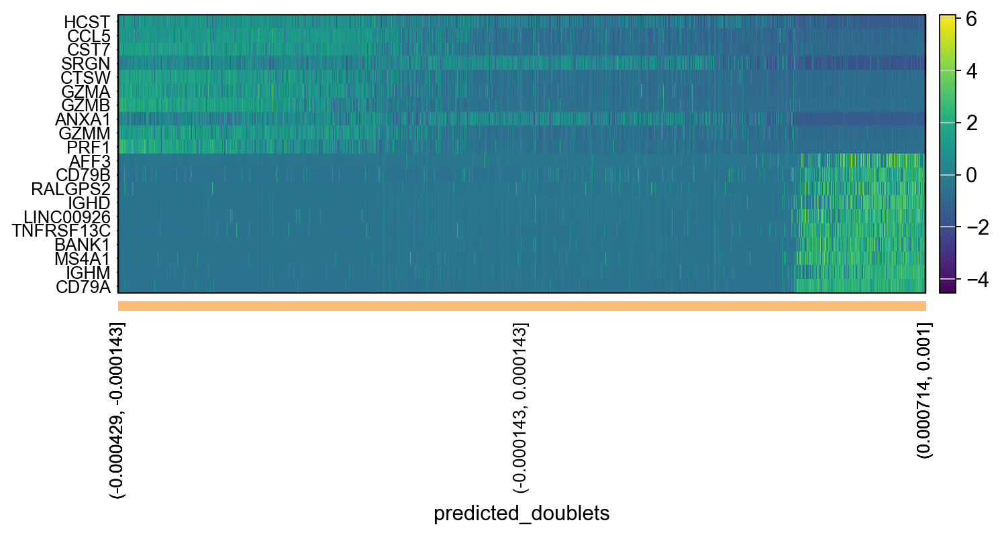

/var/folders/mn/jc4_tkl910gcsv_h9ddxdzqr0000gn/T/ipykernel_82400/3760547985.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  sc.pl.heatmap(tempdata, var_names = genes[sel].index.tolist(), groupby='predicted_doublets', swap_axes = True, use_raw=False)


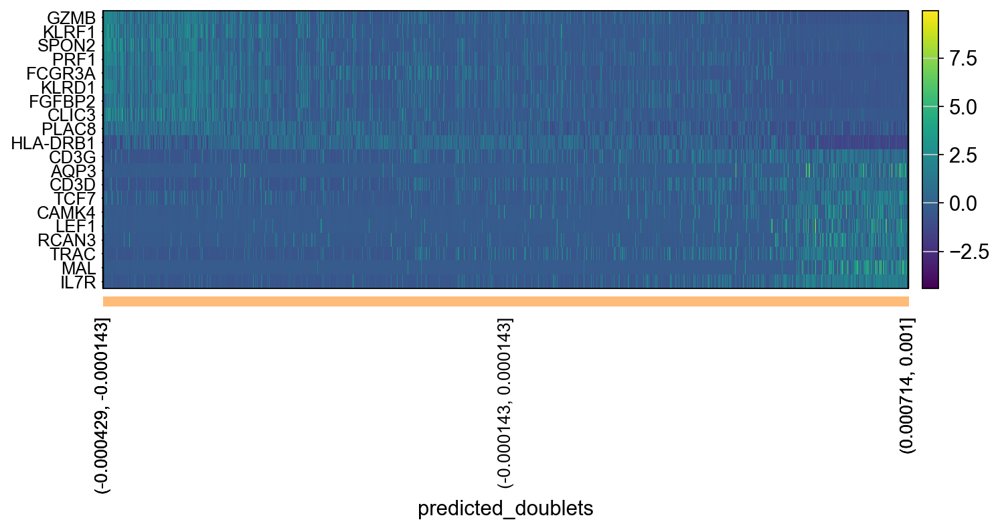

/var/folders/mn/jc4_tkl910gcsv_h9ddxdzqr0000gn/T/ipykernel_82400/3760547985.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  sc.pl.heatmap(tempdata, var_names = genes[sel].index.tolist(), groupby='predicted_doublets', swap_axes = True, use_raw=False)


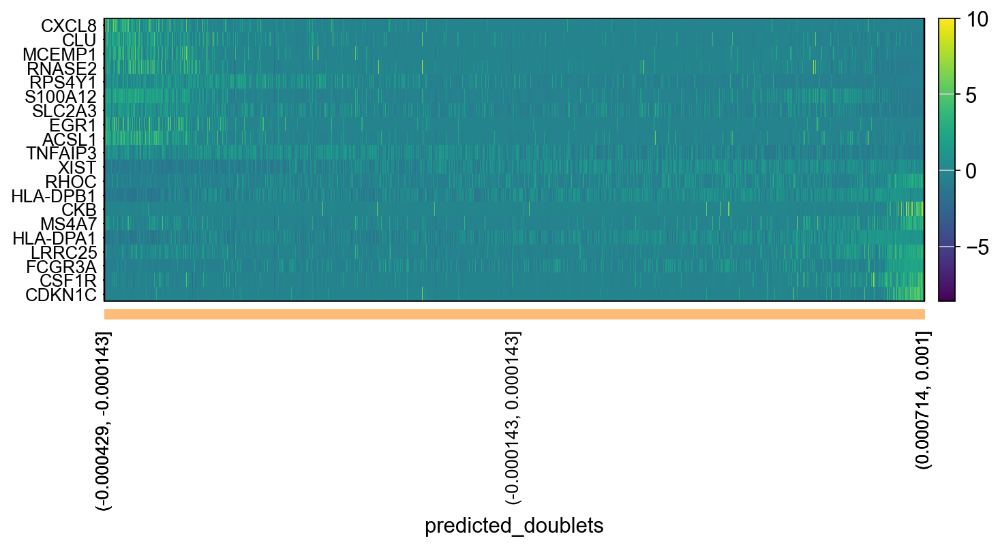

In [244]:
genes = adata.var['gene_ids']

for pc in [1,2,3,4]:
    g = adata.varm['PCs'][:,pc-1]
    o = np.argsort(g)
    sel = np.concatenate((o[:10],o[-10:])).tolist()
    emb = adata.obsm['X_pca'][:,pc-1]
    # order by position on that pc
    tempdata = adata[np.argsort(emb),]
    sc.pl.heatmap(tempdata, var_names = genes[sel].index.tolist(), groupby='predicted_doublets', swap_axes = True, use_raw=False)

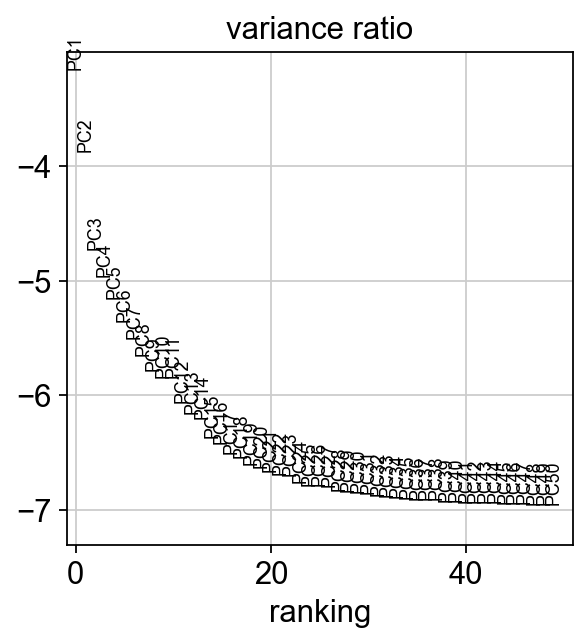

In [245]:
# variance ration 
sc.pl.pca_variance_ratio(adata, log=True, n_pcs = 50)

## tSNE

In [246]:
sc.tl.tsne(adata, n_pcs = 30)

computing tSNE
    using 'X_pca' with n_pcs = 30
    using sklearn.manifold.TSNE
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm)
    'tsne', tSNE parameters (adata.uns) (0:00:09)


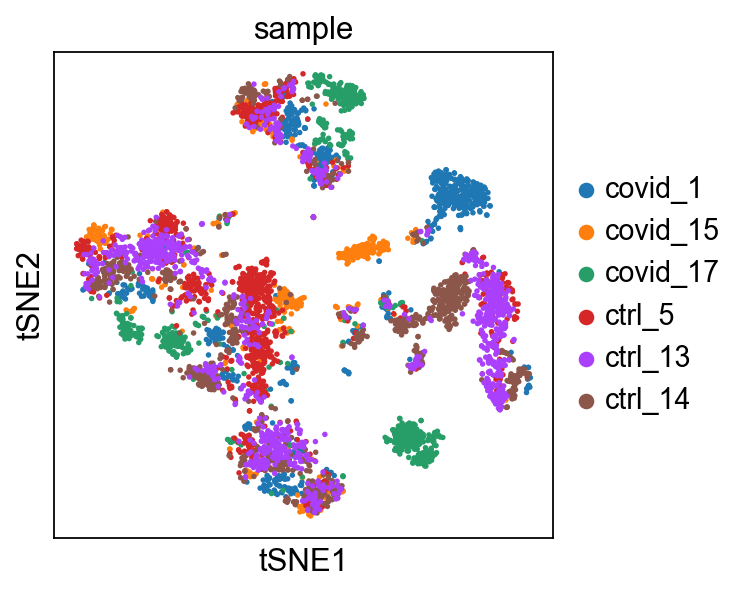

In [247]:
sc.pl.tsne(adata, color='sample')

## UMAP 

In [248]:
## CALCULATING NEIGHBOURHOOD GRAPH 
sc.pp.neighbors(adata, n_pcs = 30, n_neighbors = 20)

computing neighbors
    using 'X_pca' with n_pcs = 30
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)


In [249]:
sc.tl.umap(adata)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:08)


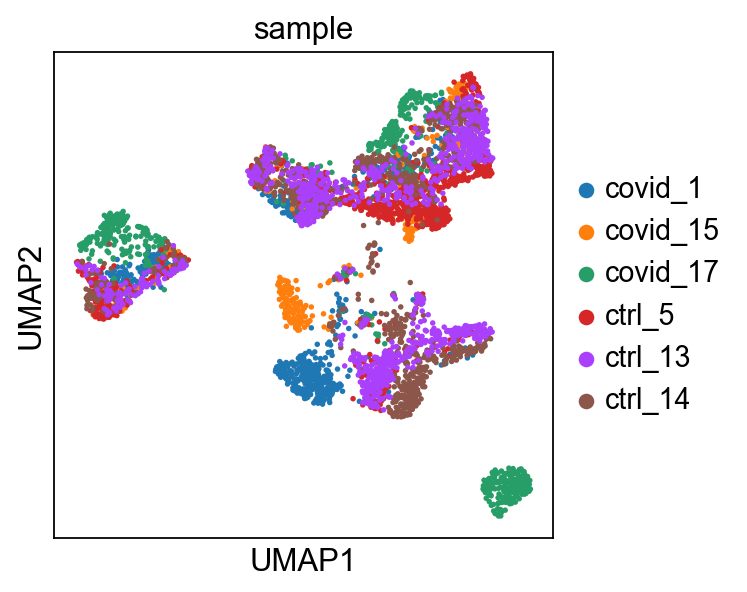

In [250]:
sc.pl.umap(adata, color='sample')   

In [251]:
# for 10 components
umap10 = sc.tl.umap(adata, n_components=10, copy=True)


computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:09)


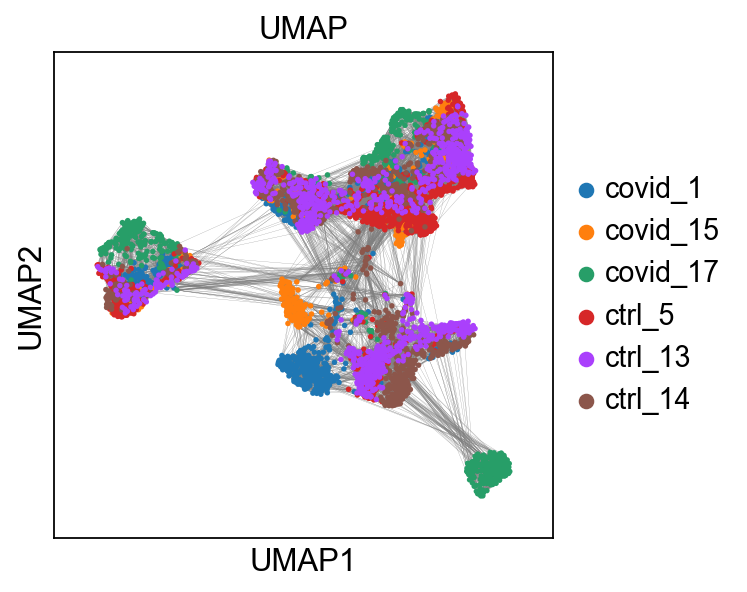

In [252]:

#  plot the umap with neighbor edges
sc.pl.umap(adata, color='sample', title="UMAP", edges=True)

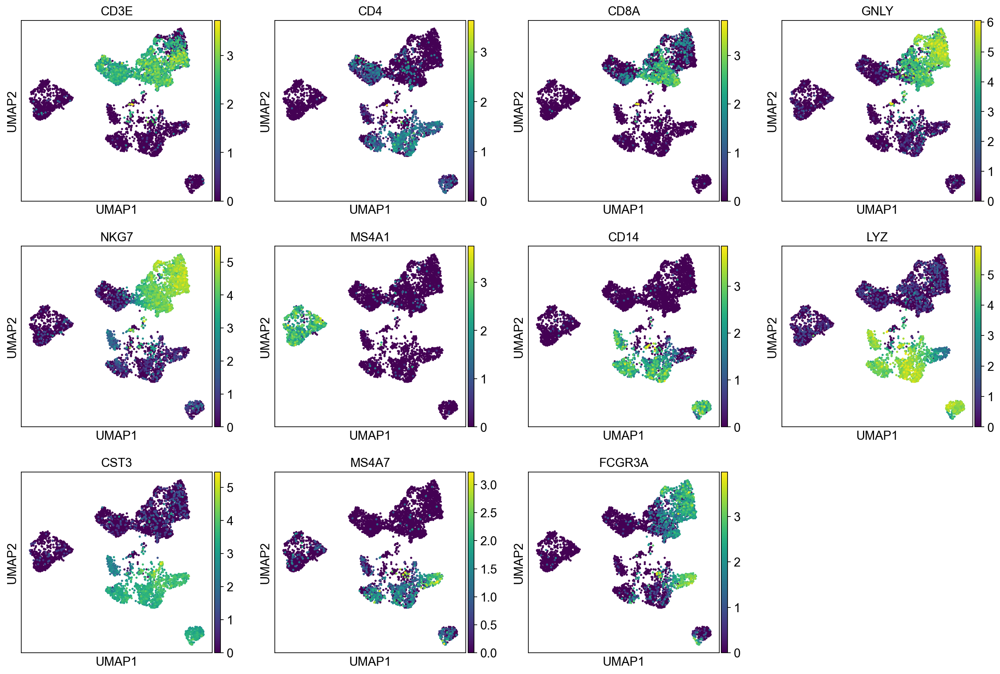

In [253]:
## PLOTS FOR GENE OF INTEREST 
sc.pl.umap(adata, color=["CD3E", "CD4", "CD8A", "GNLY","NKG7", "MS4A1","CD14","LYZ","CST3","MS4A7","FCGR3A"])

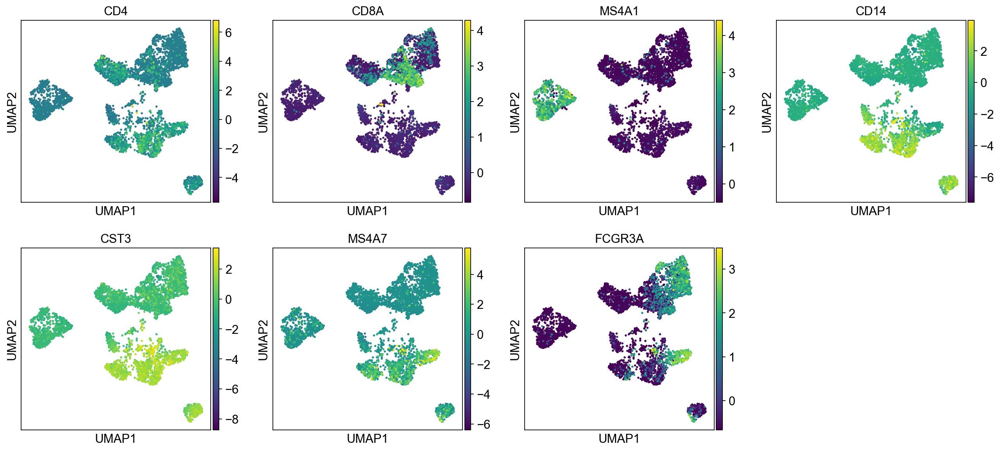

In [254]:
genes  = ["CD3E", "CD4", "CD8A", "GNLY","NKG7", "MS4A1","CD14","LYZ","CST3","MS4A7","FCGR3A"]
var_genes = adata.var.highly_variable
var_genes.index[var_genes]
varg = [x for x in genes if x in var_genes.index[var_genes]]
sc.pl.umap(adata, color=varg, use_raw=False)

In [255]:
## Writing H5ad file to save data 
adata.write_h5ad('./data/results/scanpy_dr_covid.h5ad')

In [256]:
print(adata.X.shape)
print(adata.raw.X.shape)

(4888, 3181)
(4888, 18752)


In [257]:
# Load the stored data object
save_file = './data/results/scanpy_dr_covid.h5ad'
adata = sc.read_h5ad(save_file)

In [258]:
print(adata.X.shape)

(4888, 3181)


In [259]:
adata2 = adata.raw.to_adata() 

# check that the matrix looks like noramlized counts
print(adata2.X[1:10,1:10])

<Compressed Sparse Row sparse matrix of dtype 'float64'
	with 3 stored elements and shape (9, 9)>
  Coords	Values
  (0, 5)	0.9678402572038912
  (1, 5)	0.5124039238100646
  (7, 0)	0.735933317095064


## Detect variable genes

In [260]:
var_genes_all = adata.var.highly_variable

print("Highly variable genes: %d"%sum(var_genes_all))

Highly variable genes: 3181


In [261]:
sc.pp.log1p(adata2)

In [262]:
sc.pp.highly_variable_genes(adata2, min_mean=0.0125, max_mean=3, min_disp=0.5, batch_key = 'sample')

print("Highly variable genes intersection: %d"%sum(adata2.var.highly_variable_intersection))

print("Number of batches where gene is variable:")
print(adata2.var.highly_variable_nbatches.value_counts())

var_genes_batch = adata2.var.highly_variable_nbatches > 0

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
Highly variable genes intersection: 412
Number of batches where gene is variable:
highly_variable_nbatches
0    12065
1     3093
2     1570
3      786
4      483
6      412
5      343
Name: count, dtype: int64


In [263]:

print("Any batch var genes: %d"%sum(var_genes_batch))
print("All data var genes: %d"%sum(var_genes_all))
print("Overlap: %d"%sum(var_genes_batch & var_genes_all))
print("Variable genes in all batches: %d"%sum(adata2.var.highly_variable_nbatches == 6))
print("Overlap batch instersection and all: %d"%sum(var_genes_all & adata2.var.highly_variable_intersection))

Any batch var genes: 6687
All data var genes: 3181
Overlap: 2662
Variable genes in all batches: 412
Overlap batch instersection and all: 354


In [264]:
var_select = adata2.var.highly_variable_nbatches > 2
var_genes = var_select.index[var_select]
len(var_genes)

2024

## Data Integration 

### COmbat


In [265]:
# split per batch into new objects.
batches = adata.obs['sample'].cat.categories.tolist()
alldata = {}
for batch in batches:
    alldata[batch] = adata2[adata2.obs['sample'] == batch,]

alldata    

{'covid_1': View of AnnData object with n_obs × n_vars = 740 × 18752
     obs: 'type', 'sample', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'percent_mt2', 'n_counts', 'n_genes', 'percent_chrY', 'XIST-counts', 'doublet_scores', 'predicted_doublets', 'doublet_info'
     var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
     uns: 'doublet_info_colors', 'hvg', 'log1p', 'neighbors', 'pca', 'sample_colors', 'tsne', 'umap'
     obsm: 'X_pca', 'X_tsne', 'X_umap'
     obsp: 'connectivities', 'distances',
 'covid_15': View of AnnData object with n_obs × n_vars = 414 × 18752
     obs: 'type', 'sample', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt

In [266]:
# create a new object with lognormalized counts
adata_combat = sc.AnnData(X=adata.raw.X, var=adata.raw.var, obs = adata.obs)


# first store the raw data 
adata_combat.raw = adata_combat

# run combat
sc.pp.combat(adata_combat, key='sample')

Standardizing Data across genes.

Found 6 batches

Found 0 numerical variables:
	

Found 69 genes with zero variance.
Fitting L/S model and finding priors

Finding parametric adjustments



/Users/zeus_10/Desktop/Projects/Single cell_scanpy/single_cell_covid/.venv/lib/python3.11/site-packages/scanpy/preprocessing/_combat.py:351: RuntimeWarning: invalid value encountered in divide
  (abs(g_new - g_old) / g_old).max(), (abs(d_new - d_old) / d_old).max()
/Users/zeus_10/Desktop/Projects/Single cell_scanpy/single_cell_covid/.venv/lib/python3.11/site-packages/scanpy/preprocessing/_combat.py:351: RuntimeWarning: divide by zero encountered in divide
  (abs(g_new - g_old) / g_old).max(), (abs(d_new - d_old) / d_old).max()


Adjusting data



extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
Highly variable genes: 3960


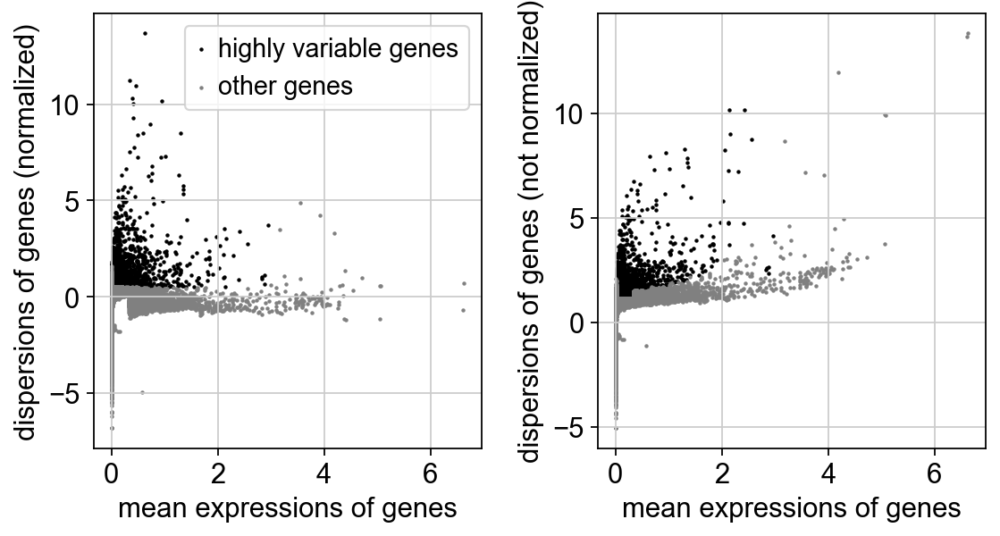

computing PCA
    with n_comps=30


/Users/zeus_10/Desktop/Projects/Single cell_scanpy/single_cell_covid/.venv/lib/python3.11/site-packages/scanpy/preprocessing/_pca.py:377: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  warn(msg, FutureWarning)


    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 30
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:07)
computing tSNE
    using 'X_pca' with n_pcs = 30
    using sklearn.manifold.TSNE
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm)
    'tsne', tSNE parameters (adata.uns) (0:00:10)


In [267]:
sc.pp.highly_variable_genes(adata_combat)
print("Highly variable genes: %d"%sum(adata_combat.var.highly_variable))
sc.pl.highly_variable_genes(adata_combat)


sc.pp.pca(adata_combat, n_comps=30, use_highly_variable=True, svd_solver='arpack')

sc.pp.neighbors(adata_combat, n_pcs =30)

sc.tl.umap(adata_combat)
sc.tl.tsne(adata_combat, n_pcs = 30)

In [268]:
# compare var_genes
var_genes_combat = adata_combat.var.highly_variable
print("With all data %d"%sum(var_genes_all))
print("With combat %d"%sum(var_genes_combat))
print("Overlap %d"%sum(var_genes_all & var_genes_combat))

print("With 2 batches %d"%sum(var_select))
print("Overlap %d"%sum(var_genes_combat & var_select))

With all data 3181
With combat 3960
Overlap 2463
With 2 batches 2024
Overlap 1375


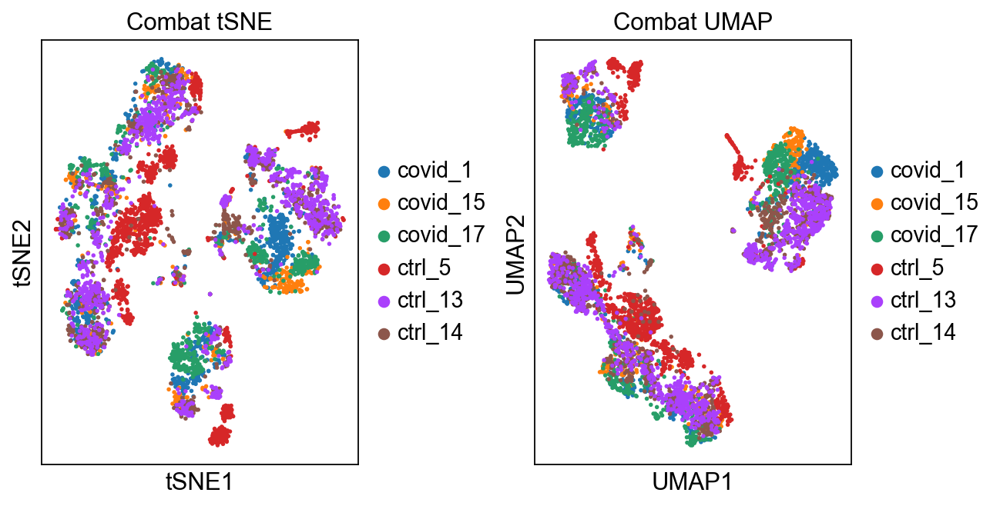

In [269]:
import matplotlib.pyplot as plt

fig, axs = plt.subplots(1, 2, figsize=(8,4), constrained_layout=True)

# Plot Combat-corrected tSNE
sc.pl.tsne(adata_combat, color="sample", title="Combat tSNE", ax=axs[0], show=False)

# Plot Combat-corrected UMAP
sc.pl.umap(adata_combat, color="sample", title="Combat UMAP", ax=axs[1], show=False)

plt.show()


In [270]:

import scanorama



#subset the individual dataset to the same variable genes as in MNN-correct.
alldata2 = dict()
for ds in alldata.keys():
    print(ds)
    alldata2[ds] = alldata[ds][:,var_genes]

#convert to list of AnnData objects
adatas = list(alldata2.values())

# run scanorama.integrate
scanorama.integrate_scanpy(adatas, dimred = 50)

covid_1
covid_15
covid_17
ctrl_5
ctrl_13
ctrl_14
Found 2024 genes among all datasets
[[0.         0.8115942  0.2986627  0.67432432 0.52837838 0.43108108]
 [0.         0.         0.54830918 0.62560386 0.39855072 0.43478261]
 [0.         0.         0.         0.43090639 0.12927192 0.21991085]
 [0.         0.         0.         0.         0.90329013 0.7108674 ]
 [0.         0.         0.         0.         0.         0.85684431]
 [0.         0.         0.         0.         0.         0.        ]]
Processing datasets (3, 4)
Processing datasets (4, 5)
Processing datasets (0, 1)
Processing datasets (3, 5)
Processing datasets (0, 3)
Processing datasets (1, 3)
Processing datasets (1, 2)
Processing datasets (0, 4)
Processing datasets (1, 5)
Processing datasets (0, 5)
Processing datasets (2, 3)
Processing datasets (1, 4)
Processing datasets (0, 2)
Processing datasets (2, 5)
Processing datasets (2, 4)


/Users/zeus_10/Desktop/Projects/Single cell_scanpy/single_cell_covid/.venv/lib/python3.11/site-packages/scanorama/scanorama.py:284: ImplicitModificationWarning: Setting element `.obsm['X_scanorama']` of view, initializing view as actual.
  adata.obsm['X_scanorama'] = X_dimred


In [271]:
#scanorama adds the corrected matrix to adata.obsm in each of the datasets in adatas.

adatas[0].obsm['X_scanorama'].shape

(740, 50)

In [272]:
# Get all the integrated matrices.
scanorama_int = [ad.obsm['X_scanorama'] for ad in adatas]

# make into one matrix.
all_s = np.concatenate(scanorama_int)
print(all_s.shape)

# add to the AnnData object
adata.obsm["Scanorama"] = all_s

(4888, 50)


In [273]:
# tsne and umap
sc.pp.neighbors(adata, n_pcs =50, use_rep = "Scanorama")
sc.tl.umap(adata)
sc.tl.tsne(adata, n_pcs = 50, use_rep = "Scanorama")

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:07)
computing tSNE
    using sklearn.manifold.TSNE
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm)
    'tsne', tSNE parameters (adata.uns) (0:00:11)


<Axes: title={'center': 'Scanorama umap'}, xlabel='UMAP1', ylabel='UMAP2'>

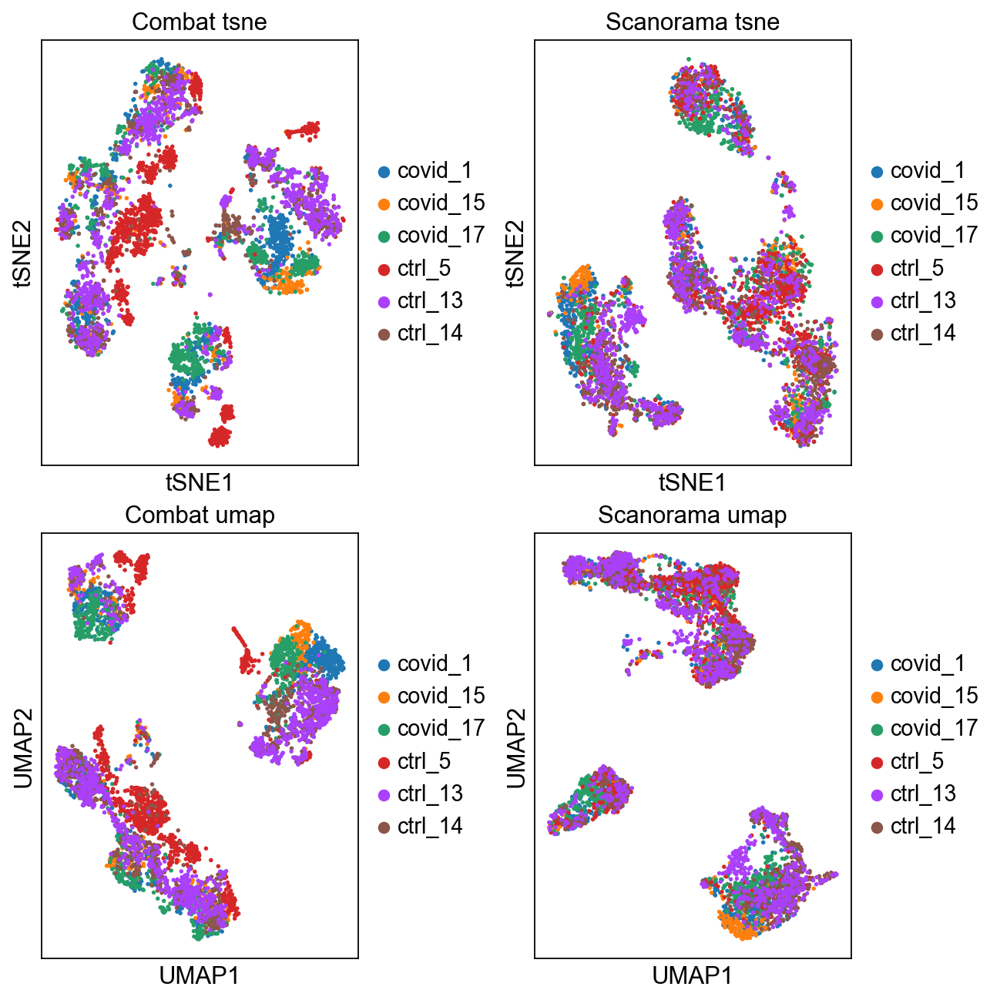

In [274]:
fig, axs = plt.subplots(2, 2, figsize=(8,8),constrained_layout=True)
sc.pl.tsne(adata_combat, color="sample", title="Combat tsne", ax=axs[0,0], show=False)
sc.pl.tsne(adata, color="sample", title="Scanorama tsne", ax=axs[0,1], show=False)
sc.pl.umap(adata_combat, color="sample", title="Combat umap", ax=axs[1,0], show=False)
sc.pl.umap(adata, color="sample", title="Scanorama umap", ax=axs[1,1], show=False)

In [275]:
## Save file into H5ad format 
save_file = './data/results/scanpy_scanorama_corrected_covid.h5ad'
adata.write_h5ad(save_file)

## clustering 

In [276]:
sc.settings.set_figure_params(dpi=80)


In [277]:
# scanorama integration data.

save_file = './data/results/scanpy_scanorama_corrected_covid.h5ad'
adata = sc.read_h5ad(save_file)

In [278]:
adata

AnnData object with n_obs × n_vars = 4888 × 3181
    obs: 'type', 'sample', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'percent_mt2', 'n_counts', 'n_genes', 'percent_chrY', 'XIST-counts', 'doublet_scores', 'predicted_doublets', 'doublet_info'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'doublet_info_colors', 'hvg', 'log1p', 'neighbors', 'pca', 'sample_colors', 'tsne', 'umap'
    obsm: 'Scanorama', 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

## Graph CLustering 


### Leiden Clustering 


In [279]:
sc.tl.leiden(adata, key_added = "leiden_1.0") # default resolution in 1.0
sc.tl.leiden(adata, resolution = 0.6, key_added = "leiden_0.6")
sc.tl.leiden(adata, resolution = 0.4, key_added = "leiden_0.4")
sc.tl.leiden(adata, resolution = 1.4, key_added = "leiden_1.4")

running Leiden clustering
    finished: found 15 clusters and added
    'leiden_1.0', the cluster labels (adata.obs, categorical) (0:00:02)
running Leiden clustering
    finished: found 11 clusters and added
    'leiden_0.6', the cluster labels (adata.obs, categorical) (0:00:01)
running Leiden clustering
    finished: found 8 clusters and added
    'leiden_0.4', the cluster labels (adata.obs, categorical) (0:00:01)
running Leiden clustering
    finished: found 16 clusters and added
    'leiden_1.4', the cluster labels (adata.obs, categorical) (0:00:02)


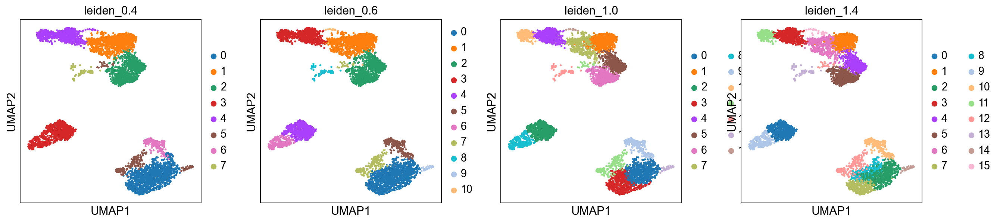

In [280]:
sc.pl.umap(adata, color=['leiden_0.4', 'leiden_0.6', 'leiden_1.0','leiden_1.4'])


    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden_0.6']`


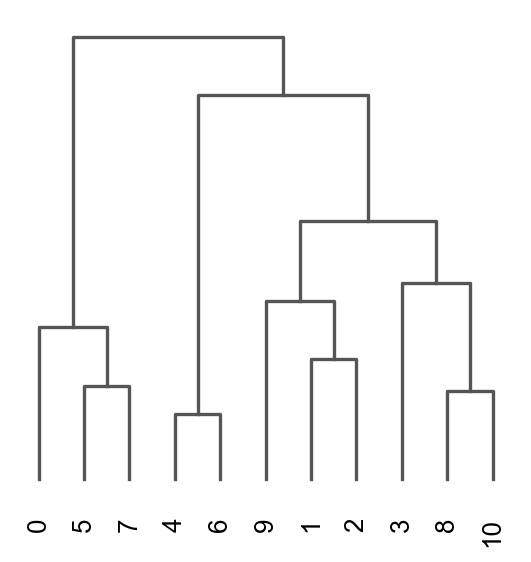

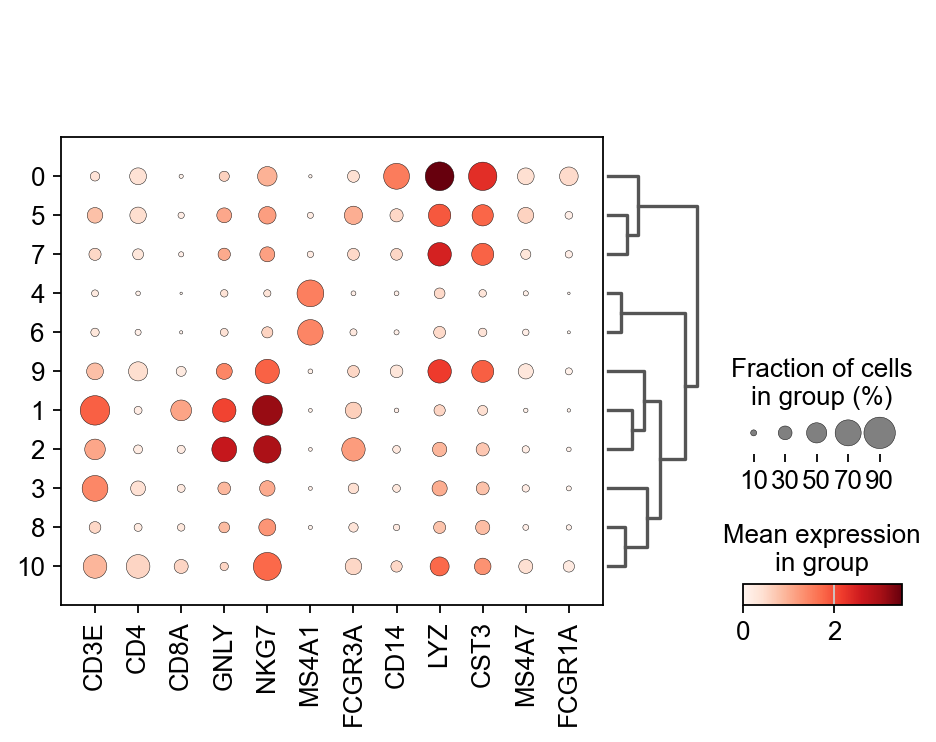

In [281]:
sc.tl.dendrogram(adata, groupby = "leiden_0.6")
sc.pl.dendrogram(adata, groupby = "leiden_0.6")

genes  = ["CD3E", "CD4", "CD8A", "GNLY","NKG7", "MS4A1","FCGR3A","CD14","LYZ","CST3","MS4A7","FCGR1A"]
sc.pl.dotplot(adata, genes, groupby='leiden_0.6', dendrogram=True)

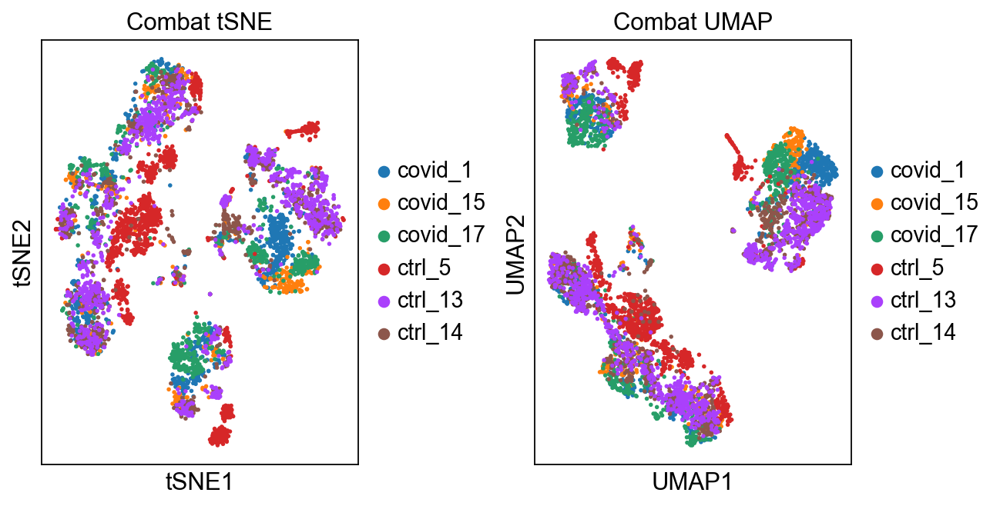

In [282]:
import matplotlib.pyplot as plt

fig, axs = plt.subplots(1, 2, figsize=(8,4), constrained_layout=True)

# Plot Combat-corrected tSNE
sc.pl.tsne(adata_combat, color="sample", title="Combat tSNE", ax=axs[0], show=False)

# Plot Combat-corrected UMAP
sc.pl.umap(adata_combat, color="sample", title="Combat UMAP", ax=axs[1], show=False)

plt.show()


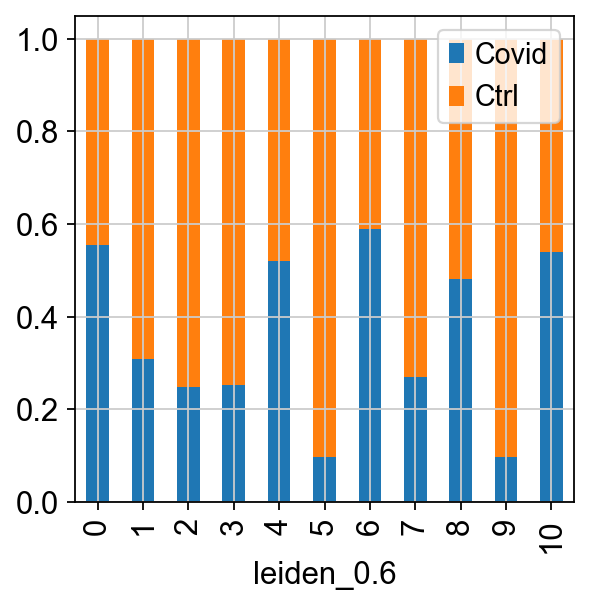

In [283]:
tmp = pd.crosstab(adata.obs['leiden_0.6'],adata.obs['type'], normalize='index')
tmp.plot.bar(stacked=True).legend(loc='upper right')

## Louvain Clustering 

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 13 clusters and added
    'louvain_1.0', the cluster labels (adata.obs, categorical) (0:00:00)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 8 clusters and added
    'louvain_0.6', the cluster labels (adata.obs, categorical) (0:00:00)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 7 clusters and added
    'louvain_0.4', the cluster labels (adata.obs, categorical) (0:00:00)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 14 clusters and added
    'louvain_1.4', the cluster labels (adata.obs, categorical) (0:00:00)


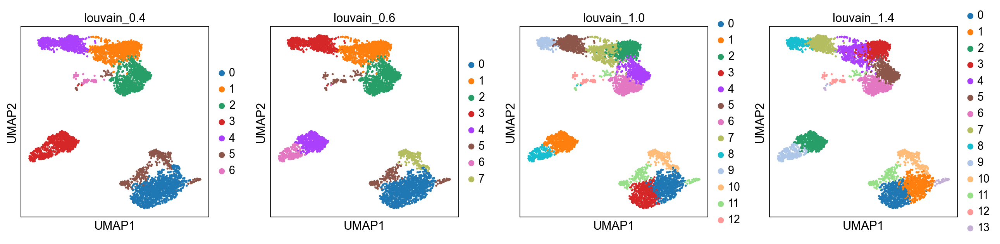

In [284]:
sc.tl.louvain(adata, key_added = "louvain_1.0") # default resolution in 1.0
sc.tl.louvain(adata, resolution = 0.6, key_added = "louvain_0.6")
sc.tl.louvain(adata, resolution = 0.4, key_added = "louvain_0.4")
sc.tl.louvain(adata, resolution = 1.4, key_added = "louvain_1.4")

sc.pl.umap(adata, color=['louvain_0.4', 'louvain_0.6', 'louvain_1.0','louvain_1.4'])

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_louvain_0.6']`


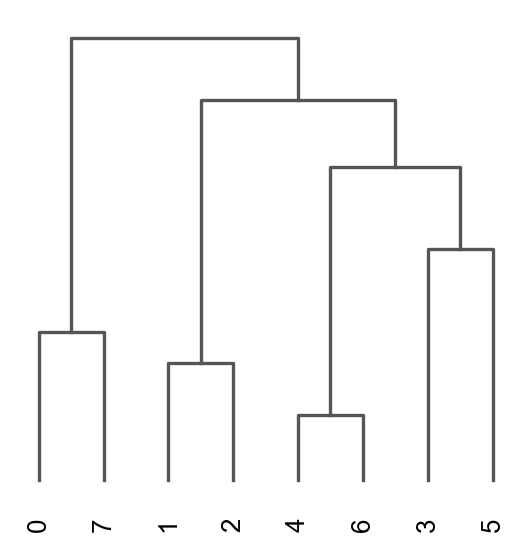

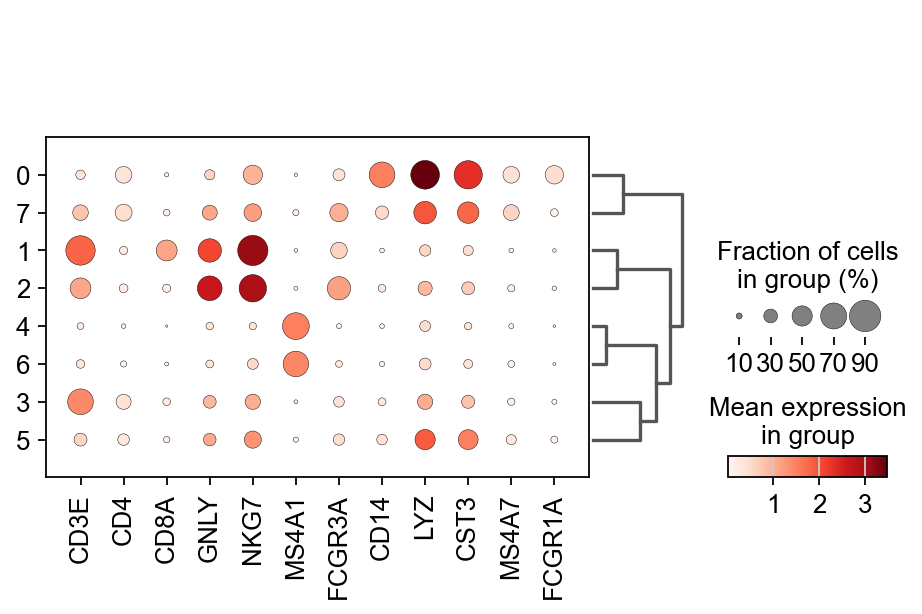

In [285]:
sc.tl.dendrogram(adata, groupby = "louvain_0.6")
sc.pl.dendrogram(adata, groupby = "louvain_0.6")

genes  = ["CD3E", "CD4", "CD8A", "GNLY","NKG7", "MS4A1","FCGR3A","CD14","LYZ","CST3","MS4A7","FCGR1A"]

sc.pl.dotplot(adata, genes, groupby='louvain_0.6', dendrogram=True)


In [286]:
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score


## K-Means CLustering 


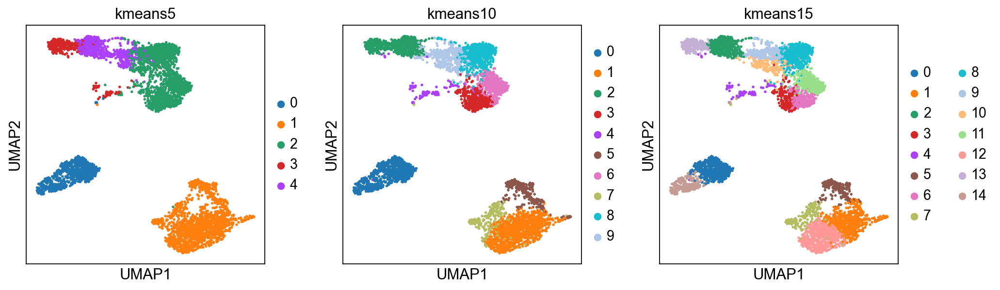

In [287]:
# extract pca coordinates
X_pca = adata.obsm['Scanorama'] 

# kmeans with k=5
kmeans = KMeans(n_clusters=5, random_state=0).fit(X_pca) 
adata.obs['kmeans5'] = kmeans.labels_.astype(str)

# kmeans with k=10
kmeans = KMeans(n_clusters=10, random_state=0).fit(X_pca) 
adata.obs['kmeans10'] = kmeans.labels_.astype(str)

# kmeans with k=15
kmeans = KMeans(n_clusters=15, random_state=0).fit(X_pca) 
adata.obs['kmeans15'] = kmeans.labels_.astype(str)

sc.pl.umap(adata, color=['kmeans5', 'kmeans10', 'kmeans15'])

In [288]:
## Hierarchical clustering 

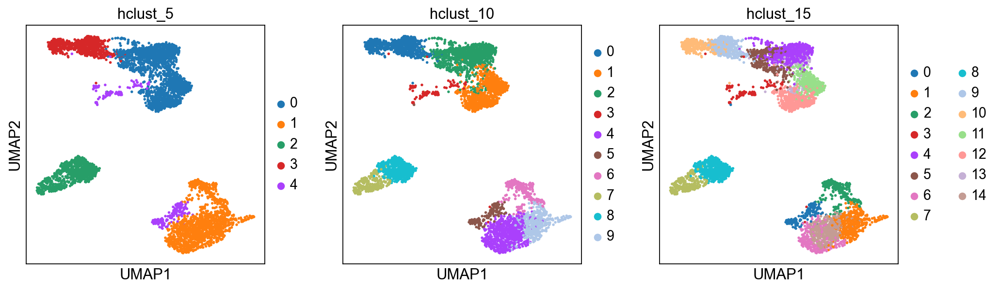

In [289]:
from sklearn.cluster import AgglomerativeClustering

# Cluster with 5 clusters
cluster = AgglomerativeClustering(n_clusters=5, metric='euclidean', linkage='ward')
adata.obs['hclust_5'] = cluster.fit_predict(X_pca).astype(str)

# Cluster with 10 clusters
cluster = AgglomerativeClustering(n_clusters=10, metric='euclidean', linkage='ward')
adata.obs['hclust_10'] = cluster.fit_predict(X_pca).astype(str)

# Cluster with 15 clusters
cluster = AgglomerativeClustering(n_clusters=15, metric='euclidean', linkage='ward')
adata.obs['hclust_15'] = cluster.fit_predict(X_pca).astype(str)

# Plot UMAP with clusters
sc.pl.umap(adata, color=['hclust_5', 'hclust_10', 'hclust_15'])


In [290]:
## Saving the data in a h5ad format 

adata.write_h5ad('./data/results/scanpy_clustered_covid.h5ad')

## Differential Expression Analsysis


In [291]:
import gseapy

In [292]:

adata = sc.read_h5ad('./data/results/scanpy_clustered_covid.h5ad')

In [293]:
print(adata.X.shape)
print(adata.raw.X.shape)
print(adata.raw.X[:10,:10])

(4888, 3181)
(4888, 18752)
<Compressed Sparse Row sparse matrix of dtype 'float64'
	with 5 stored elements and shape (10, 10)>
  Coords	Values
  (0, 1)	0.9043687482537638
  (0, 6)	0.9043687482537638
  (1, 6)	0.9678402572038912
  (2, 6)	0.5124039238100646
  (8, 1)	0.735933317095064


In [294]:
adata = adata.raw.to_adata()
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)
sc.pp.log1p(adata)

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added
    'n_counts', counts per cell before normalization (adata.obs)


## T-test 

ranking genes
    finished: added to `.uns['t-test']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


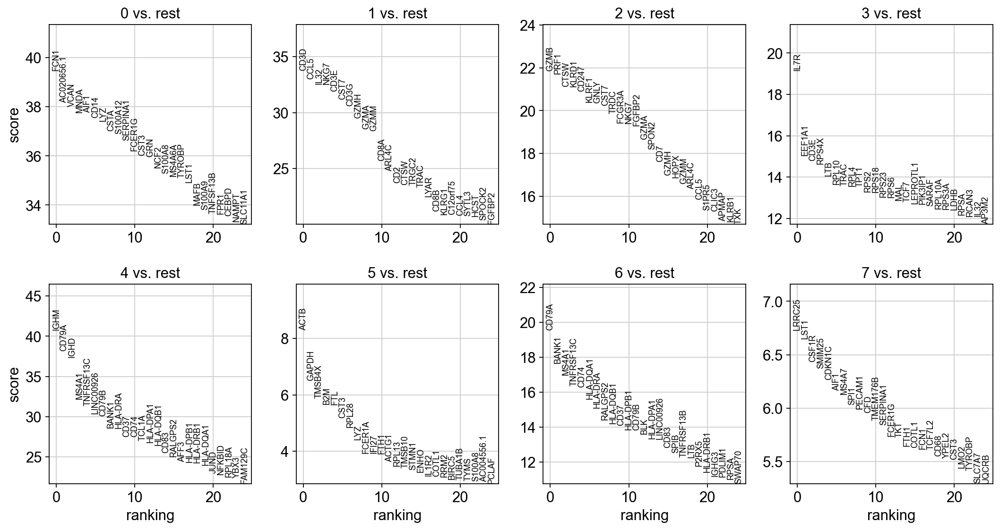

In [295]:
sc.tl.rank_genes_groups(adata, 'louvain_0.6', method='t-test', key_added = "t-test")
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False, key = "t-test")

## T- test Overestimated 

ranking genes
    finished: added to `.uns['t-test_ov']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


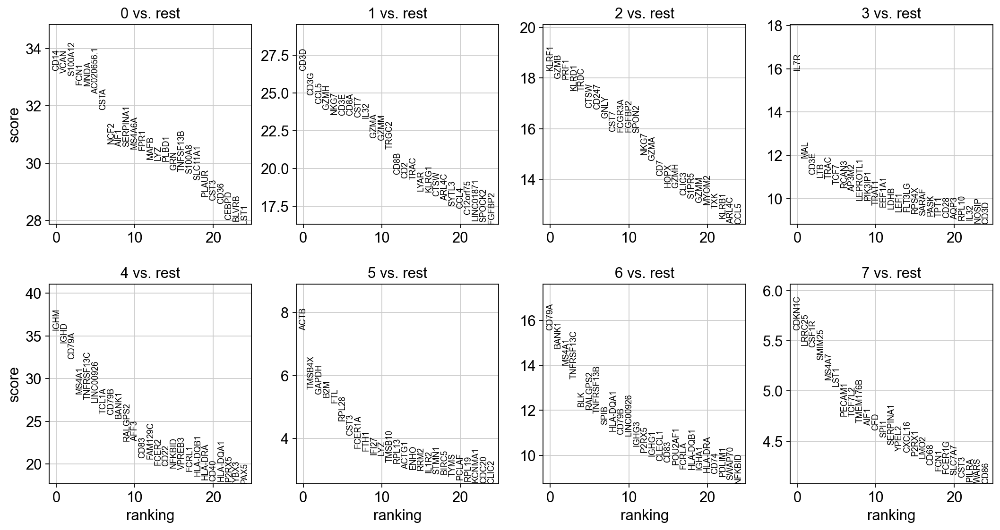

In [296]:
sc.tl.rank_genes_groups(adata, 'louvain_0.6', method='t-test_overestim_var', key_added = "t-test_ov")
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False, key= "t-test_ov")

## Wilcoxon rank-sum

ranking genes
    finished: added to `.uns['wilcoxon']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:03)


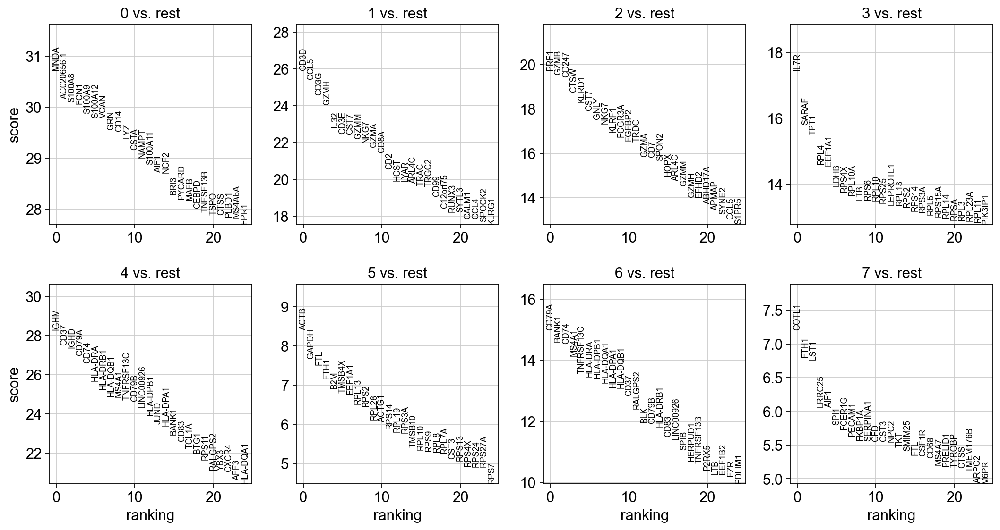

In [297]:
sc.tl.rank_genes_groups(adata, 'louvain_0.6', method='wilcoxon', key_added= "wilcoxon")
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False, key="wilcoxon")

### Logisttic Regression test 


ranking genes
    finished: added to `.uns['logreg']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
 (0:00:08)


/Users/zeus_10/Desktop/Projects/Single cell_scanpy/single_cell_covid/.venv/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


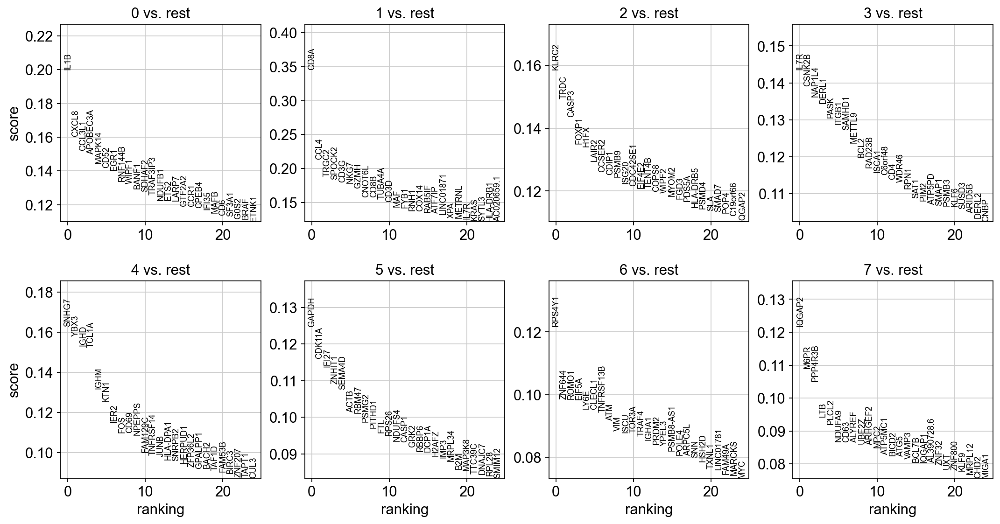

In [298]:

sc.tl.rank_genes_groups(adata, 'louvain_0.6', method='logreg',key_added = "logreg")
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False, key = "logreg")


### Comparing Genes 

#### compare DE gnes for cluster 0 with each test

In [299]:
wc = sc.get.rank_genes_groups_df(adata, group='0', key='wilcoxon', pval_cutoff=0.01, log2fc_min=0)['names']
tt = sc.get.rank_genes_groups_df(adata, group='0', key='t-test', pval_cutoff=0.01, log2fc_min=0)['names']
tt_ov = sc.get.rank_genes_groups_df(adata, group='0', key='t-test_ov', pval_cutoff=0.01, log2fc_min=0)['names']

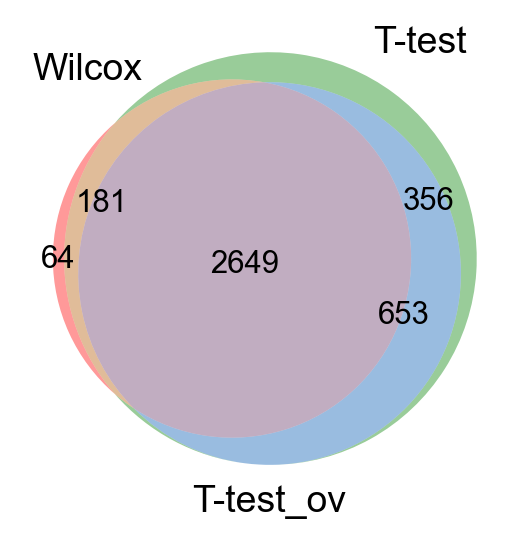

In [300]:
from matplotlib_venn import venn3
venn3([set(wc),set(tt),set(tt_ov)], ('Wilcox','T-test','T-test_ov') )
plt.show()

## HEAT MAP and Visulization 

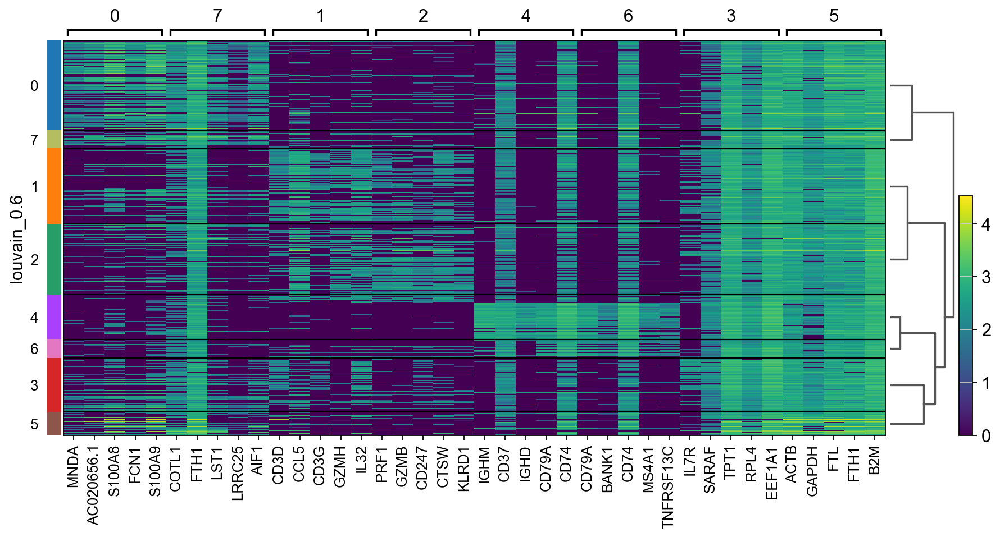

In [301]:
sc.pl.rank_genes_groups_heatmap(adata, n_genes=5, key="wilcoxon", groupby="louvain_0.6", show_gene_labels=True)

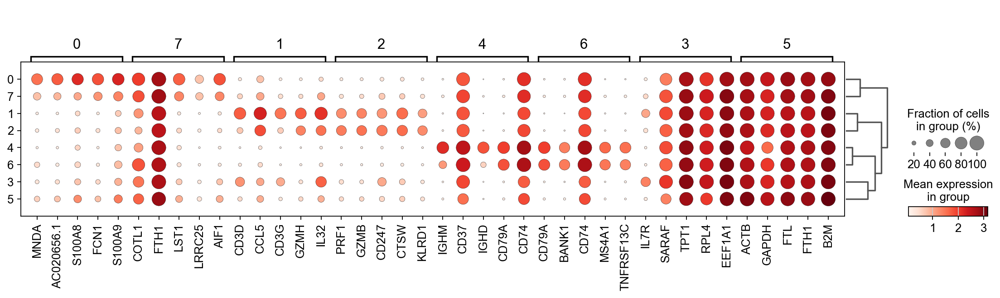

In [302]:
## DOT Plot 
sc.pl.rank_genes_groups_dotplot(adata, n_genes=5, key="wilcoxon", groupby="louvain_0.6")

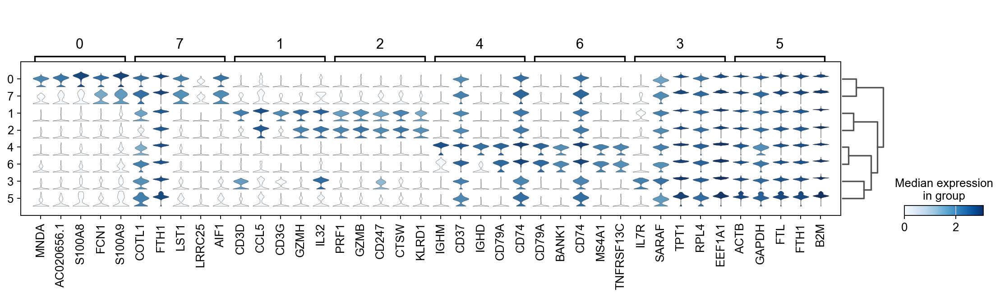

In [303]:
### Stacked Violin Plot 
sc.pl.rank_genes_groups_stacked_violin(adata, n_genes=5, key="wilcoxon", groupby="louvain_0.6")

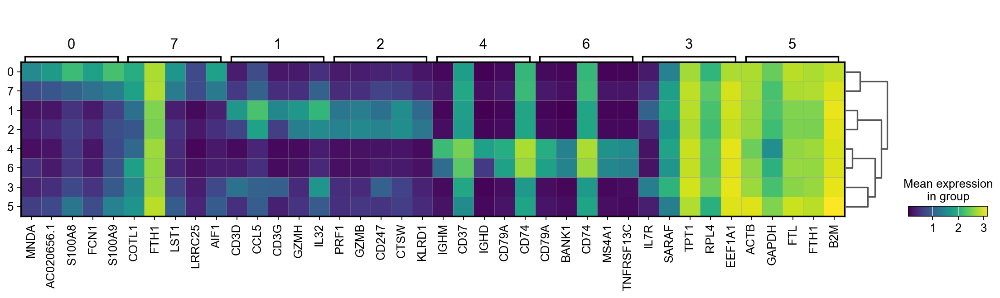

In [304]:
## Matrix PLot 
sc.pl.rank_genes_groups_matrixplot(adata, n_genes=5, key="wilcoxon", groupby="louvain_0.6")



## specific clusters Analysis 



ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:01)


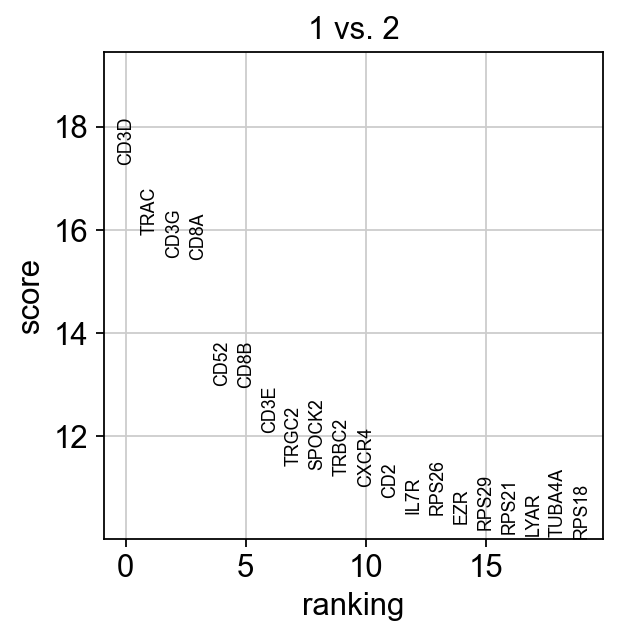

In [305]:
sc.tl.rank_genes_groups(adata, 'louvain_0.6', groups=['1'], reference='2', method='wilcoxon')
sc.pl.rank_genes_groups(adata, groups=['1'], n_genes=20)


/Users/zeus_10/Desktop/Projects/Single cell_scanpy/single_cell_covid/.venv/lib/python3.11/site-packages/scanpy/plotting/_tools/__init__.py:1320: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  _ax.set_xticklabels(new_gene_names, rotation="vertical")


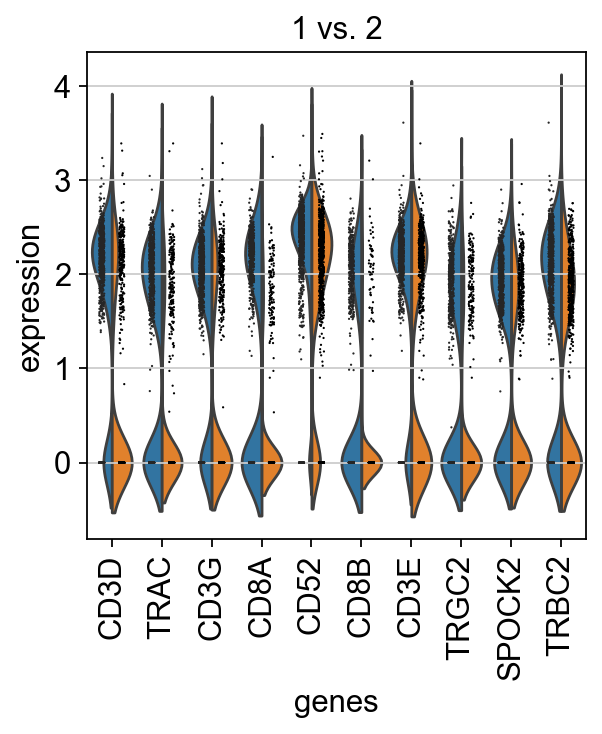

In [306]:
sc.pl.rank_genes_groups_violin(adata, groups='1', n_genes=10)

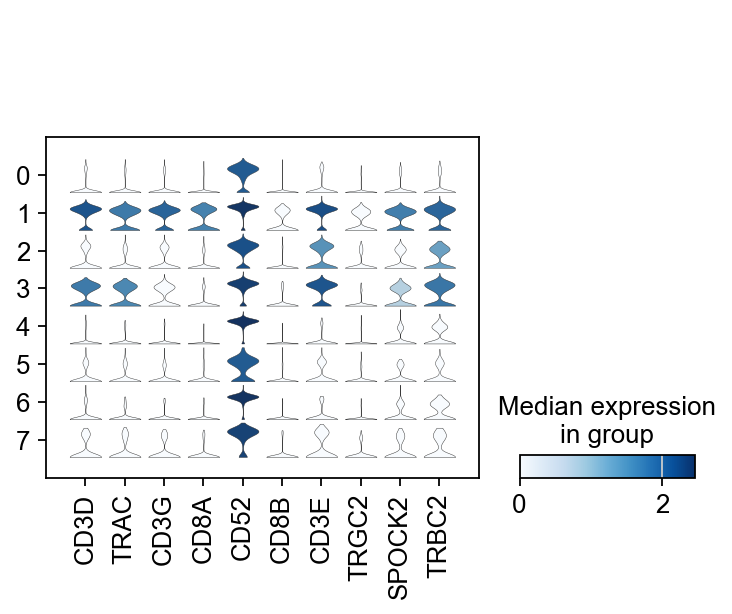

In [307]:
# convert numpy.recarray to list
mynames = [x[0] for x in adata.uns['rank_genes_groups']['names'][:10]]
sc.pl.stacked_violin(adata, mynames, groupby = 'louvain_0.6')

## Differential Expression  across various Conditions 


In [308]:
cl1 = adata[adata.obs['louvain_0.6'] =='1',:]
cl1.obs['type'].value_counts()

type
Ctrl     642
Covid    291
Name: count, dtype: int64

ranking genes


/Users/zeus_10/Desktop/Projects/Single cell_scanpy/single_cell_covid/.venv/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:645: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


    finished: added to `.uns['wilcoxon']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:01)


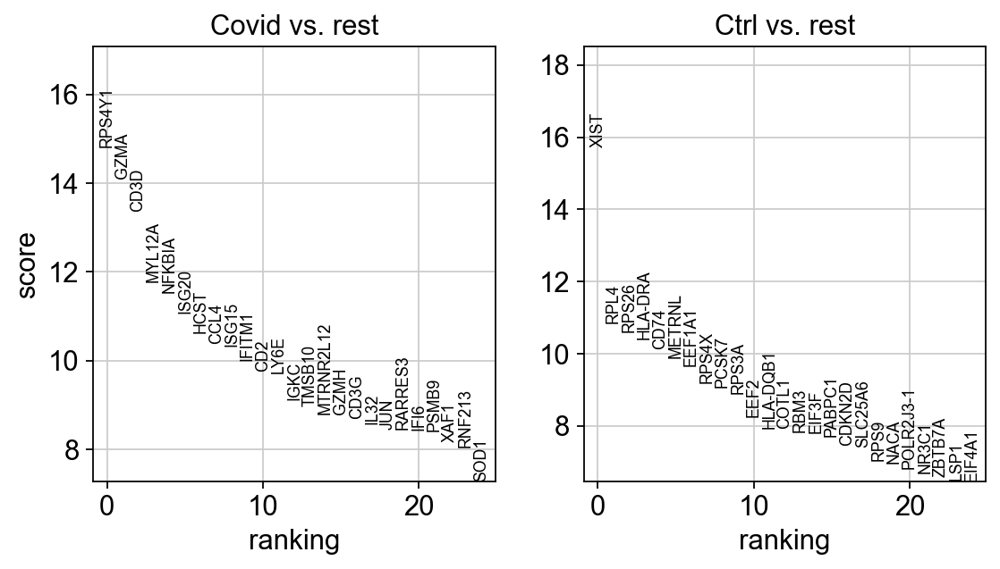

In [309]:
sc.tl.rank_genes_groups(cl1, 'type', method='wilcoxon', key_added = "wilcoxon")
sc.pl.rank_genes_groups(cl1, n_genes=25, sharey=False, key = "wilcoxon")

/Users/zeus_10/Desktop/Projects/Single cell_scanpy/single_cell_covid/.venv/lib/python3.11/site-packages/scanpy/plotting/_tools/__init__.py:1320: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  _ax.set_xticklabels(new_gene_names, rotation="vertical")


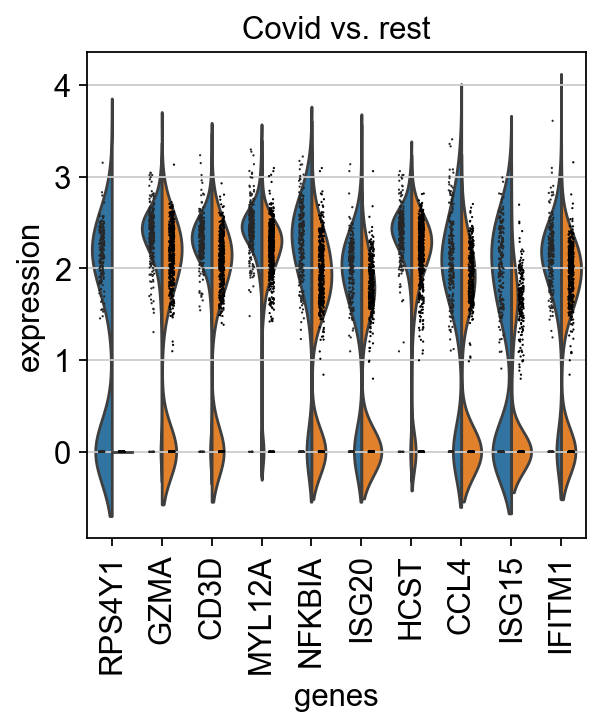

/Users/zeus_10/Desktop/Projects/Single cell_scanpy/single_cell_covid/.venv/lib/python3.11/site-packages/scanpy/plotting/_tools/__init__.py:1320: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  _ax.set_xticklabels(new_gene_names, rotation="vertical")


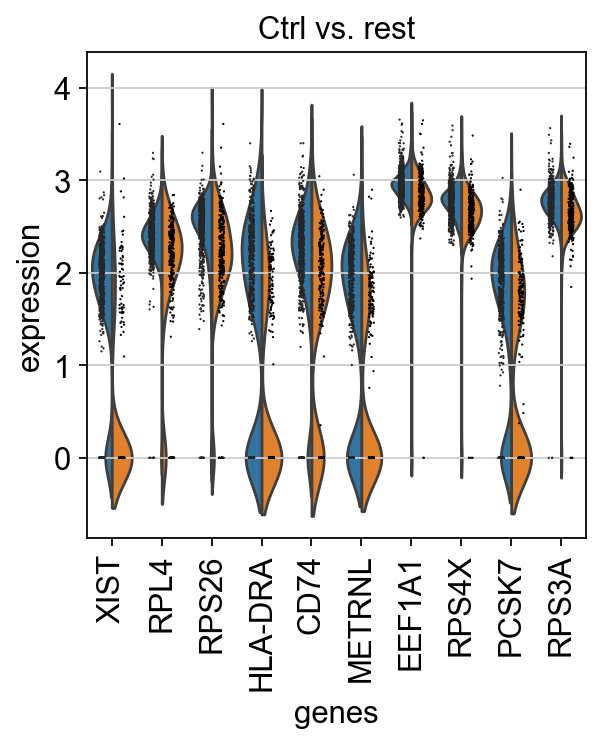

In [310]:
## Ranking genes (violin plots )
sc.pl.rank_genes_groups_violin(cl1, n_genes=10, key="wilcoxon")

## CATplot 

In [311]:
genes1 = sc.get.rank_genes_groups_df(cl1, group='Covid', key='wilcoxon')['names'][:5]
genes2 = sc.get.rank_genes_groups_df(cl1, group='Ctrl', key='wilcoxon')['names'][:5]
genes = genes1.tolist() +  genes2.tolist() 
df_marker  = sc.get.obs_df(adata, genes + ['louvain_0.6','type'], use_raw=False)
df2 = df_marker .melt(id_vars=["louvain_0.6",'type'], value_vars=genes)

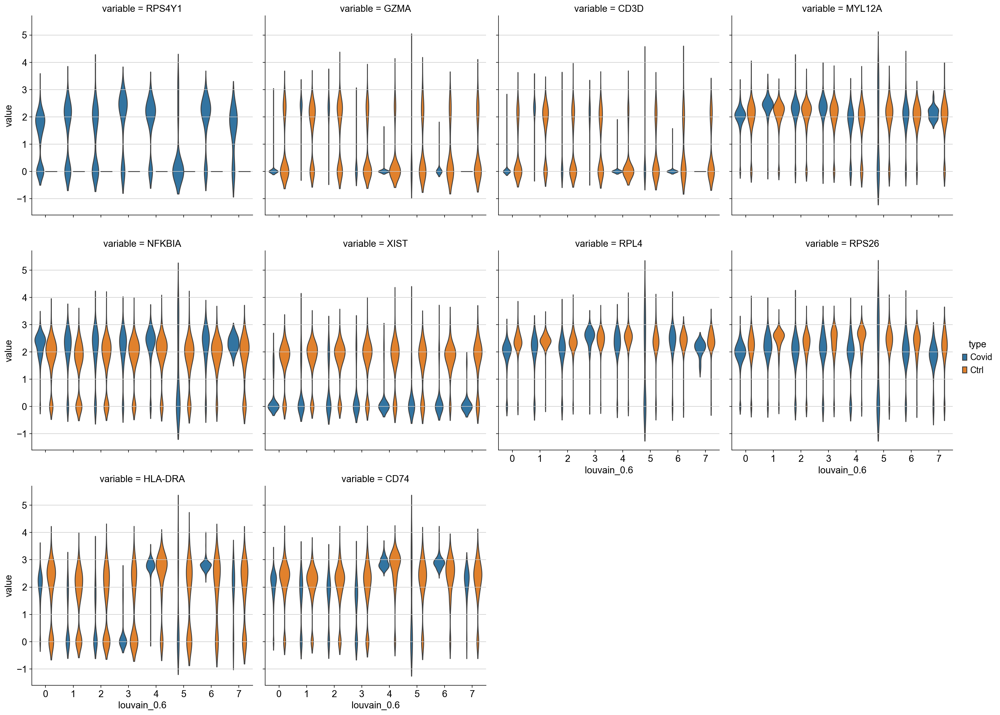

In [312]:
sns.catplot(x = "louvain_0.6", y = "value", hue = "type", kind = 'violin', 
               col = "variable", data = df2, col_wrap=4, inner=None)

## Gene Set Analysis 

In [313]:

# Fetch the gene set names
gene_set_names = gseapy.get_library_name(organism='Human')

# Print each gene set name 
for name in gene_set_names:
    print(name)

ARCHS4_Cell-lines
ARCHS4_IDG_Coexp
ARCHS4_Kinases_Coexp
ARCHS4_TFs_Coexp
ARCHS4_Tissues
Achilles_fitness_decrease
Achilles_fitness_increase
Aging_Perturbations_from_GEO_down
Aging_Perturbations_from_GEO_up
Allen_Brain_Atlas_10x_scRNA_2021
Allen_Brain_Atlas_down
Allen_Brain_Atlas_up
Azimuth_2023
Azimuth_Cell_Types_2021
BioCarta_2013
BioCarta_2015
BioCarta_2016
BioPlanet_2019
BioPlex_2017
CCLE_Proteomics_2020
CORUM
COVID-19_Related_Gene_Sets
COVID-19_Related_Gene_Sets_2021
Cancer_Cell_Line_Encyclopedia
CellMarker_2024
CellMarker_Augmented_2021
ChEA_2013
ChEA_2015
ChEA_2016
ChEA_2022
Chromosome_Location
Chromosome_Location_hg19
ClinVar_2019
DGIdb_Drug_Targets_2024
DSigDB
Data_Acquisition_Method_Most_Popular_Genes
DepMap_CRISPR_GeneDependency_CellLines_2023
DepMap_WG_CRISPR_Screens_Broad_CellLines_2019
DepMap_WG_CRISPR_Screens_Sanger_CellLines_2019
Descartes_Cell_Types_and_Tissue_2021
Diabetes_Perturbations_GEO_2022
DisGeNET
Disease_Perturbations_from_GEO_down
Disease_Perturbations_from_GE

In [314]:
glist = sc.get.rank_genes_groups_df(cl1, group='Covid', 
                                    key='wilcoxon',
                                    log2fc_min=0.25, 
                                    pval_cutoff=0.01)['names'].squeeze().str.strip().tolist()
print(len(glist))

185


In [315]:
enr_res = gseapy.enrichr(gene_list=glist,
                     organism='Human',
                     gene_sets='GO_Biological_Process_2018',
                     cutoff = 0.5)

In [316]:
enr_res.results.head()

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes
0,GO_Biological_Process_2018,cellular response to type I interferon (GO:007...,11/65,1.824009e-11,1.177398e-08,0,0,23.134419,572.054017,BST2;ISG20;IFITM1;SP100;MX1;IFI6;ISG15;IFI35;X...
1,GO_Biological_Process_2018,type I interferon signaling pathway (GO:0060337),11/65,1.824009e-11,1.177398e-08,0,0,23.134419,572.054017,BST2;ISG20;IFITM1;SP100;MX1;IFI6;ISG15;IFI35;X...
2,GO_Biological_Process_2018,cytokine-mediated signaling pathway (GO:0019221),27/633,3.509208e-11,1.510129e-08,0,0,5.416750,130.397675,IFITM1;SP100;IFI6;IFI35;IFIT3;PSMA7;MT2A;SOCS1...
3,GO_Biological_Process_2018,antigen receptor-mediated signaling pathway (G...,15/257,1.778104e-08,5.738830e-06,0,0,7.136485,127.351529,TRAC;THEMIS;CD3G;CD3D;PSMA7;PSMB8;PSMB9;NFKBIA...
4,GO_Biological_Process_2018,T cell receptor signaling pathway (GO:0050852),12/163,3.951256e-08,1.020214e-05,0,0,9.032959,153.981673,NFKBIA;PSMC5;LCK;TRAC;TRBC1;THEMIS;PSME2;CD3G;...


/Users/zeus_10/Desktop/Projects/Single cell_scanpy/single_cell_covid/.venv/lib/python3.11/site-packages/gseapy/plot.py:694: FutureWarning: The 'method' keyword in Series.replace is deprecated and will be removed in a future version.
  df[self.colname].replace(
/Users/zeus_10/Desktop/Projects/Single cell_scanpy/single_cell_covid/.venv/lib/python3.11/site-packages/gseapy/plot.py:694: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[self.colname].replace(


<Axes: title={'center': 'GO_Biological_Process_2018'}, xlabel='$- \\log_{10}$ (Adjusted P-value)'>

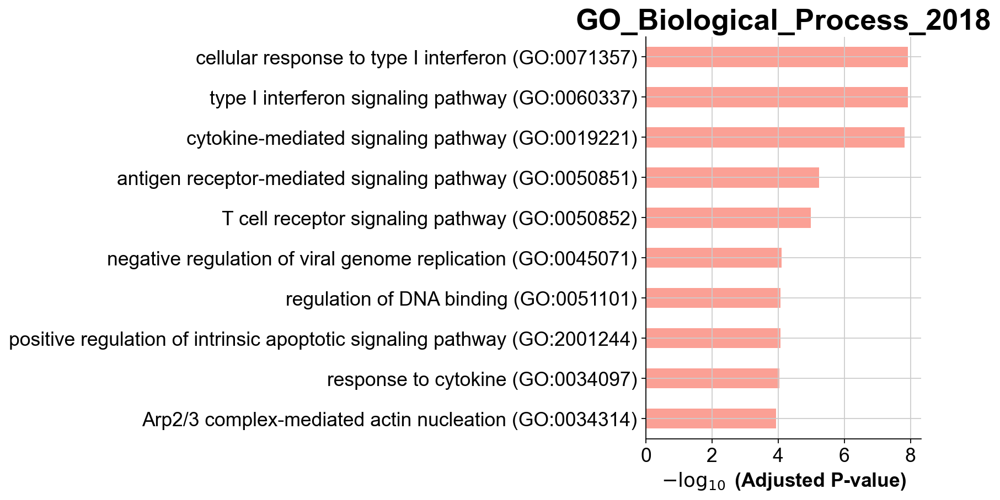

In [317]:
# Barplot for scanning GSEA 
gseapy.barplot(enr_res.res2d,title='GO_Biological_Process_2018')

## Enrichment - GSEA 


In [318]:
# Get the gene ranking data for the group 'Covid' using Wilcoxon test
gene_rank = sc.get.rank_genes_groups_df(cl1, group='Covid', key='wilcoxon')[['names', 'logfoldchanges']]

# Sort the genes by log fold change in descending order
gene_rank.sort_values(by=['logfoldchanges'], inplace=True, ascending=False)


In [319]:
# Calculate QC metrics for the cells in cl1
sc.pp.calculate_qc_metrics(cl1, percent_top=None, log1p=False, inplace=True)

# Filter out genes that are expressed in fewer than 35 cells
gene_rank = gene_rank[gene_rank['names'].isin(cl1.var_names[cl1.var.n_cells_by_counts > 30])]


In [320]:
# Gene ranking based on log fold change 
gene_rank

,names,logfoldchanges
0,RPS4Y1,31.352980
35,DDX3Y,29.129417
89,EIF1AY,28.553265
196,TTTY15,28.093138
309,UTY,27.709085
...,...,...
18439,AC004556.1,-27.532579
18263,LGALS2,-27.686165
18447,TMEM176B,-27.858284
18554,MPEG1,-27.994612


In [321]:
# Perform GSEA prerank analysis using KEGG 2021 Human gene sets
res = gseapy.prerank(rnk=gene_rank.set_index('names')['logfoldchanges'], gene_sets='KEGG_2021_Human')


In [322]:
# Extract the top terms from the GSEA results
terms = res.res2d.index[:20]

terms

RangeIndex(start=0, stop=20, step=1)

In [323]:
# # Plot the results for the top-ranked term
# if len(terms) > 0:
#     gseapy.gseaplot(rank_metric=res.ranking, term=terms[0], **res.results[terms[0]])
# else:
#     print("No significant terms found for plotting.")

In [324]:
adata.write_h5ad('./data/results/scanpy_DGE_covid.h5ad')

In [325]:
sc.settings.set_figure_params(dpi=80)

In [326]:
adata = sc.read_h5ad('./data/results/scanpy_clustered_covid.h5ad')

In [327]:
print(adata.shape)
print(adata.raw.shape)

(4888, 3181)
(4888, 18752)


In [328]:
# Subset for ctrl_13 sample.

adata = adata[adata.obs["sample"] == "ctrl_13",:]
print(adata.shape)

(1101, 3181)


/Users/zeus_10/Desktop/Projects/Single cell_scanpy/single_cell_covid/.venv/lib/python3.11/site-packages/scanpy/plotting/_utils.py:487: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


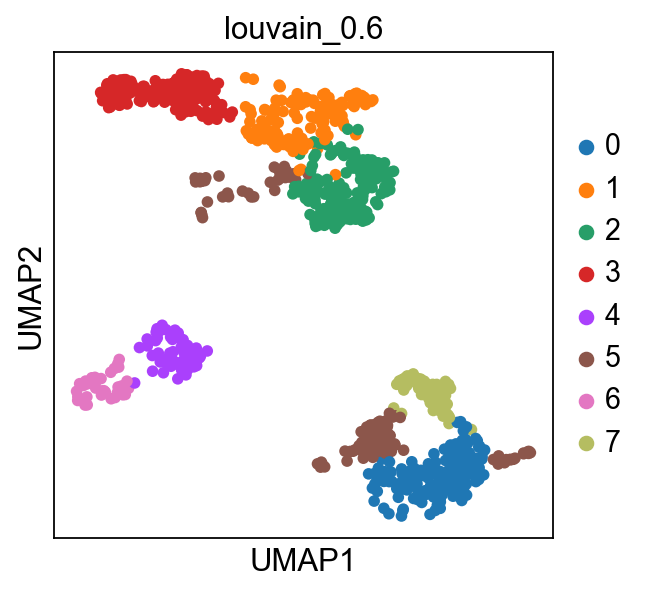

In [329]:

sc.pl.umap(adata, color=["louvain_0.6"], palette= sc.pl.palettes.default_20)

In [330]:
# load reference data
adata_ref = sc.datasets.pbmc3k_processed() 


In [331]:

adata_ref.obs['sample']='pbmc3k'

print(adata_ref.shape)
adata_ref.obs

(2638, 1838)


,n_genes,percent_mito,n_counts,louvain,sample
index,,,,,
AAACATACAACCAC-1,781,0.030178,2419.0,CD4 T cells,pbmc3k
AAACATTGAGCTAC-1,1352,0.037936,4903.0,B cells,pbmc3k
AAACATTGATCAGC-1,1131,0.008897,3147.0,CD4 T cells,pbmc3k
AAACCGTGCTTCCG-1,960,0.017431,2639.0,CD14+ Monocytes,pbmc3k
AAACCGTGTATGCG-1,522,0.012245,980.0,NK cells,pbmc3k
...,...,...,...,...,...
TTTCGAACTCTCAT-1,1155,0.021104,3459.0,CD14+ Monocytes,pbmc3k
TTTCTACTGAGGCA-1,1227,0.009294,3443.0,B cells,pbmc3k
TTTCTACTTCCTCG-1,622,0.021971,1684.0,B cells,pbmc3k


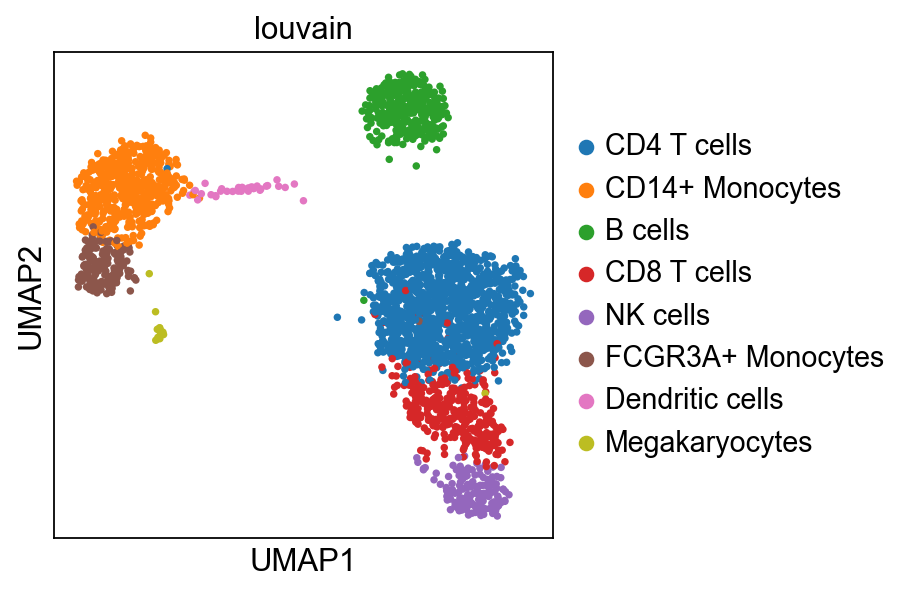

In [332]:
sc.pl.umap(adata_ref, color='louvain')

In [333]:
print(adata_ref.shape[1])
print(adata.shape[1])
var_names = adata_ref.var_names.intersection(adata.var_names)
print(len(var_names))

1838
3181
525


In [334]:
adata_ref = adata_ref[:, var_names]
adata = adata[:, var_names]


computing PCA
    with n_comps=50
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP


/Users/zeus_10/Desktop/Projects/Single cell_scanpy/single_cell_covid/.venv/lib/python3.11/site-packages/scanpy/preprocessing/_pca.py:317: ImplicitModificationWarning: Setting element `.obsm['X_pca']` of view, initializing view as actual.
  adata.obsm[key_obsm] = X_pca


    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:04)


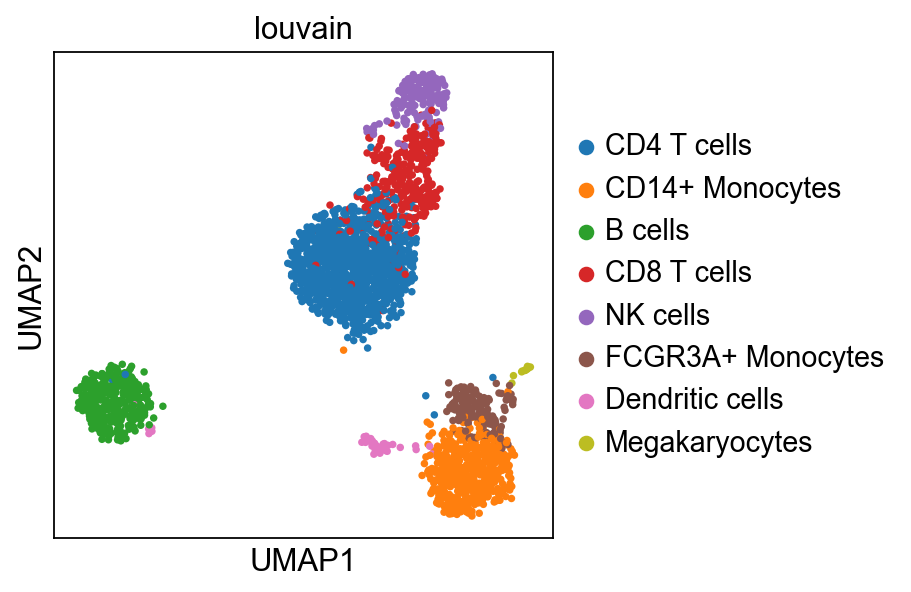

In [335]:
sc.pp.pca(adata_ref)
sc.pp.neighbors(adata_ref)
sc.tl.umap(adata_ref)
sc.pl.umap(adata_ref, color='louvain')

computing PCA
    with n_comps=50
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP


/Users/zeus_10/Desktop/Projects/Single cell_scanpy/single_cell_covid/.venv/lib/python3.11/site-packages/scanpy/preprocessing/_pca.py:317: ImplicitModificationWarning: Setting element `.obsm['X_pca']` of view, initializing view as actual.
  adata.obsm[key_obsm] = X_pca


    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:02)


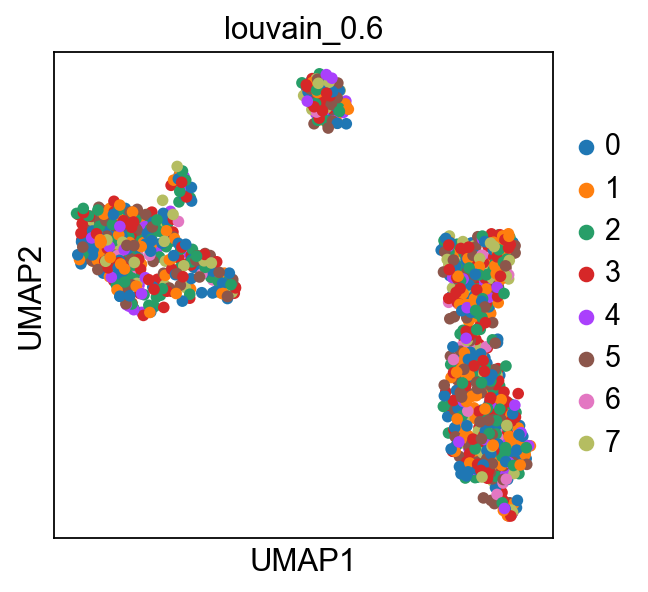

In [336]:
sc.pp.pca(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)
sc.pl.umap(adata, color='louvain_0.6')

### Integrating with Sanoma 

In [337]:
import scanorama


#subset the individual dataset to the same variable genes as in MNN-correct.
alldata = dict()
alldata['ctrl']=adata
alldata['ref']=adata_ref

#convert to list of AnnData objects
adatas = list(alldata.values())

# run scanorama.integrate
scanorama.integrate_scanpy(adatas, dimred = 50)

Found 525 genes among all datasets
[[0.         0.96548592]
 [0.         0.        ]]
Processing datasets (0, 1)


In [338]:
# add in sample info
adata_ref.obs['sample']='pbmc3k'

In [339]:
# create a merged scanpy object and add in the scanorama 
adata_merged = alldata['ctrl'].concatenate(alldata['ref'], batch_key='sample', batch_categories=['ctrl','pbmc3k'])

embedding = np.concatenate([ad.obsm['X_scanorama'] for ad in adatas], axis=0)

adata_merged.obsm['Scanorama'] = embedding

/var/folders/mn/jc4_tkl910gcsv_h9ddxdzqr0000gn/T/ipykernel_82400/2358018963.py:2: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  adata_merged = alldata['ctrl'].concatenate(alldata['ref'], batch_key='sample', batch_categories=['ctrl','pbmc3k'])


In [340]:
#run  umap.
sc.pp.neighbors(adata_merged, n_pcs =50, use_rep = "Scanorama")
sc.tl.umap(adata_merged)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:06)


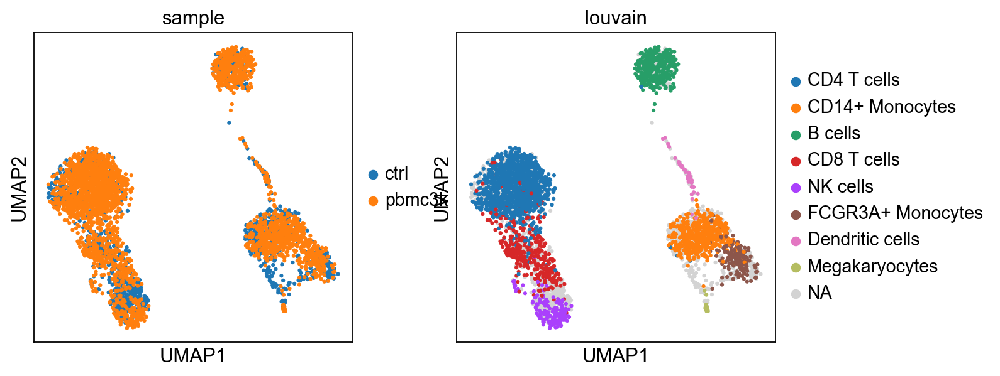

In [341]:

sc.pl.umap(adata_merged, color=["sample","louvain"])

## modifying labels 


In [342]:
from sklearn.metrics.pairwise import cosine_distances

distances = 1 - cosine_distances(
    adata_merged[adata_merged.obs['sample'] == "pbmc3k"].obsm["Scanorama"],
    adata_merged[adata_merged.obs['sample'] == "ctrl"].obsm["Scanorama"],
)

In [343]:
# def label_transfer(dist, labels, index):
#     lab = pd.get_dummies(labels)
#     class_prob = lab.to_numpy().T @ dist
#     norm = np.linalg.norm(class_prob, 2, axis=0)
#     class_prob = class_prob / norm
#     class_prob = (class_prob.T - class_prob.min(1)) / class_prob.ptp(1)
#     # convert to df
#     cp_df = pd.DataFrame(
#         class_prob, columns=lab.columns
#     )
#     cp_df.index = index
#     # classify as max score
#     m = cp_df.idxmax(axis=1)
    

In [344]:

def label_transfer(dist, labels, index):
    # Compute the class probabilities
    class_prob = 1 / (1 + dist)
    
    # Normalize
    norm = np.linalg.norm(class_prob, 2, axis=0)
    class_prob = class_prob / norm
    
    # Replace `class_prob.ptp(1)` with `np.ptp(class_prob, axis=1)`
    class_prob = (class_prob.T - class_prob.min(1)) / np.ptp(class_prob, axis=1)
    
    # Convert to dataframe
    cp_df = pd.DataFrame(class_prob, columns=labels, index=index)

    
    # Find the most likely class for each observation
    class_def = cp_df.idxmax(1)
    
    return class_def

# Run label transfer
class_def = label_transfer(distances, adata_ref.obs.louvain, adata.obs.index)

# Add the predicted class to adata.obs
adata.obs['predicted'] = class_def


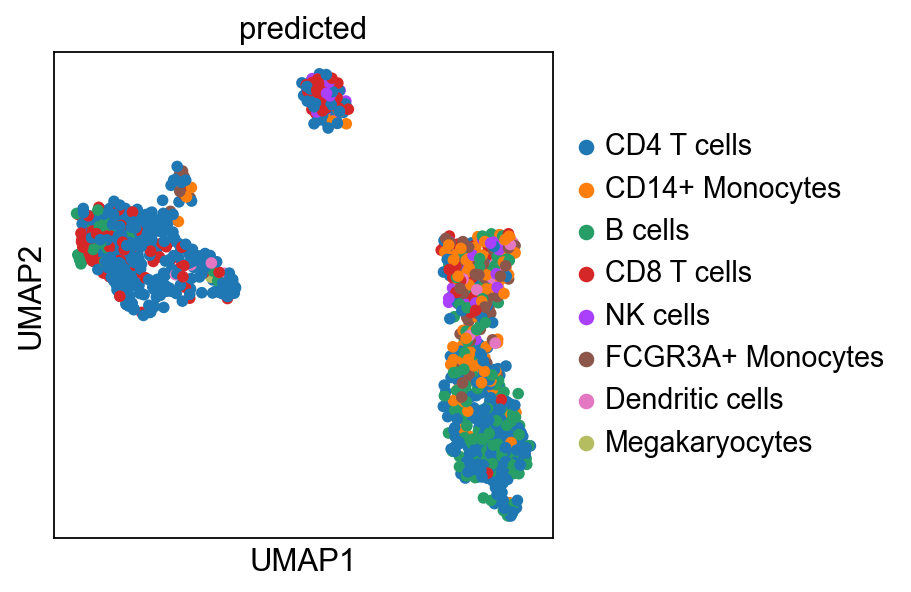

In [345]:

sc.pl.umap(adata, color="predicted")

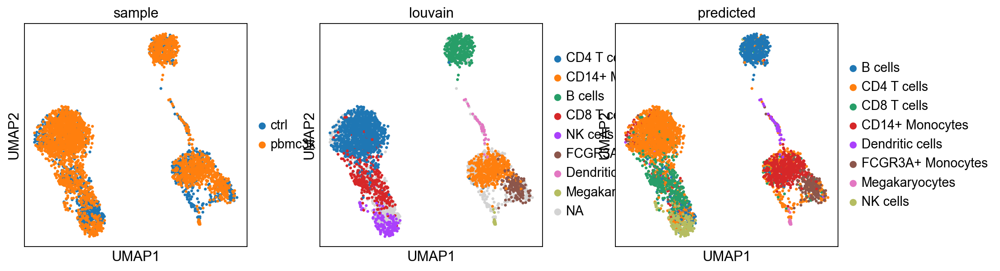

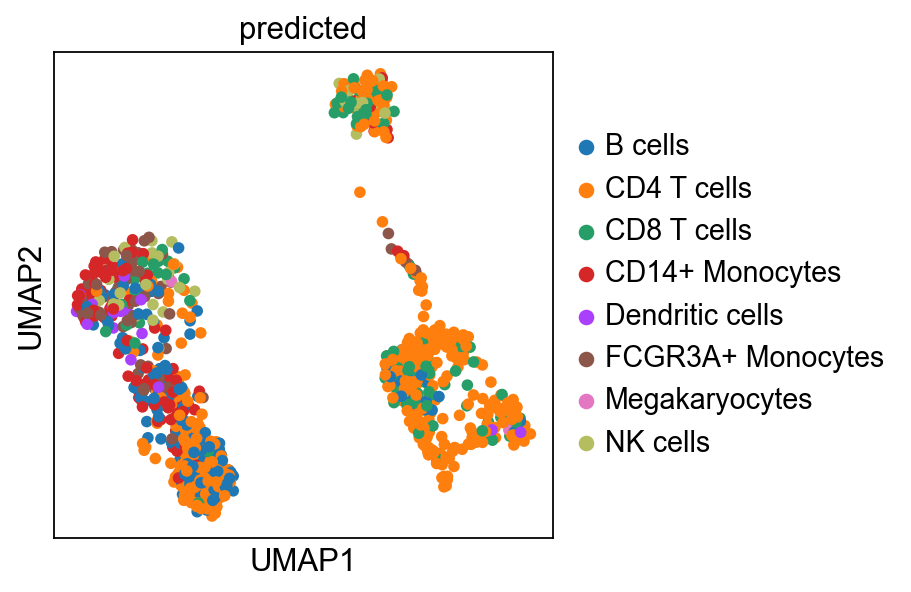

In [346]:
# Concatenate the predicted class with the louvain labels and convert to a list
class_def_combined = pd.concat([class_def, adata_ref.obs['louvain']]).tolist()

# Add this combined list to the merged object
adata_merged.obs['predicted'] = class_def_combined

# Plot UMAP for the merged data
sc.pl.umap(adata_merged, color=["sample", "louvain", "predicted"])

# Plot only for ctrl cells
sc.pl.umap(adata_merged[adata_merged.obs['sample'] == 'ctrl'], color='predicted')


## INGEST - integration 

In [347]:
sc.tl.ingest(adata, adata_ref, obs='louvain')

running ingest


/Users/zeus_10/Desktop/Projects/Single cell_scanpy/single_cell_covid/.venv/lib/python3.11/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


    finished (0:00:09)


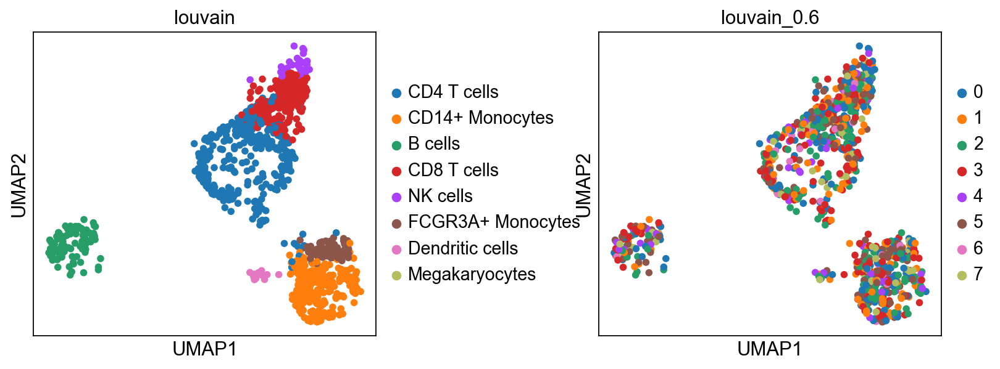

In [348]:
# RUNNING umap of Injested sample 
sc.pl.umap(adata, color=['louvain','louvain_0.6'], wspace=0.5) 


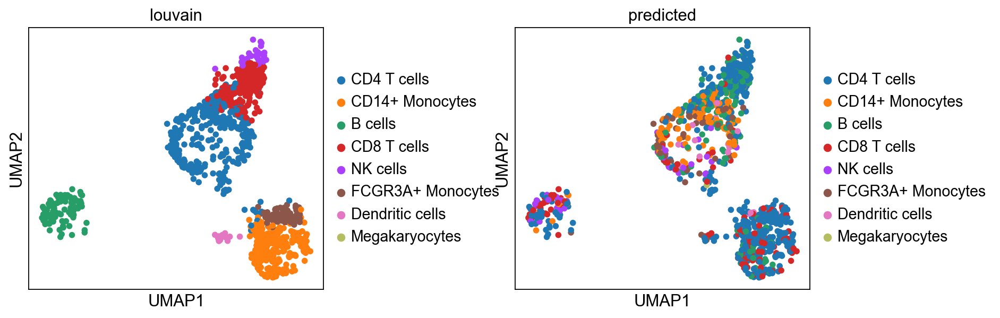

In [349]:
## Comparing the results 
sc.pl.umap(adata, color=['louvain','predicted'], wspace=0.5)

In [365]:
df_marker  = pd.read_excel('./data/Cell_marker_Human.xlsx')



In [366]:
df_marker

,species,tissue_class,tissue_type,uberonongology_id,cancer_type,cell_type,cell_name,cellontology_id,marker,Symbol,GeneID,Genetype,Genename,UNIPROTID,technology_seq,marker_source,PMID,Title,journal,year
0,Human,Abdomen,Abdomen,UBERON_0000916,Normal,Normal cell,Macrophage,CL_0000235,MERTK,MERTK,10461.0,protein_coding,"MER proto-oncogene, tyrosine kinase",Q12866,NaN,Experiment,31982413.0,Peritoneal Level of CD206 Associates With Mort...,Gastroenterology,2020.0
1,Human,Abdomen,Abdomen,UBERON_0000916,Normal,Normal cell,Macrophage,CL_0000235,CD16,FCGR3A,2215.0,protein_coding,Fc fragment of IgG receptor IIIb,O75015,NaN,Experiment,31982413.0,Peritoneal Level of CD206 Associates With Mort...,Gastroenterology,2020.0
2,Human,Abdomen,Abdomen,UBERON_0000916,Normal,Normal cell,Macrophage,CL_0000235,CD206,MRC1,4360.0,protein_coding,mannose receptor C-type 1,P22897,NaN,Experiment,31982413.0,Peritoneal Level of CD206 Associates With Mort...,Gastroenterology,2020.0
3,Human,Abdomen,Abdomen,UBERON_0000916,Normal,Normal cell,Macrophage,CL_0000235,CRIg,VSIG4,11326.0,protein_coding,V-set and immunoglobulin domain containing 4,Q9Y279,NaN,Experiment,31982413.0,Peritoneal Level of CD206 Associates With Mort...,Gastroenterology,2020.0
4,Human,Abdomen,Abdomen,UBERON_0000916,Normal,Normal cell,Macrophage,CL_0000235,CD163,CD163,9332.0,protein_coding,CD163 molecule,Q86VB7,NaN,Experiment,31982413.0,Peritoneal Level of CD206 Associates With Mort...,Gastroenterology,2020.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
60872,Human,Vein,Vein,UBERON_0001638,Normal,Normal cell,Venous cell,NaN,LRG1,LRG1,116844.0,protein_coding,leucine rich alpha-2-glycoprotein 1,P02750,10x Chromium,Experiment,33996252.0,Single-cell transcriptomics reveals the landsc...,Molecular therapy. Nucleic acids,2021.0
60873,Human,Vein,Vein,UBERON_0001638,Normal,Normal cell,Venous cell,NaN,EMCN,EMCN,51705.0,protein_coding,endomucin,Q9ULC0,10x Chromium,Experiment,33996252.0,Single-cell transcriptomics reveals the landsc...,Molecular therapy. Nucleic acids,2021.0
60874,Human,Vein,Vein,UBERON_0001638,Normal,Normal cell,Systemic–venous endothelial cell,NaN,COL15A1,COL15A1,1306.0,protein_coding,collagen type XV alpha 1 chain,B3KTP7,10x Chromium,Experiment,34030460.0,Integrated Single-Cell Atlas of Endothelial Ce...,Circulation,2021.0
60875,Human,NaN,Intestine,UBERON_0000160,Normal,Normal cell,B cell,CL_0000236,CD19,CD19,930.0,protein_coding,CD19 molecule,P15391,10x Chromium,Experiment,34269788.0,CD16+CD163+ monocytes traffic to sites of infl...,The Journal of experimental medicine,2021.0


In [352]:
df_marker.shape

(60877, 20)

In [369]:

# Filter for number of genes.
print(df_marker.shape)
df_marker['nG'] = df.Symbol.str.split(",").str.len()
df_marker.shape

(60877, 21)


(60877, 21)

(0, 21)
